# Rainfall Weather Forecasting

## Project Description

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
## 1. Problem Statement: 

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


## Dataset Description:

Number of columns: 23

Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


## Dataset Link - 

•	https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv

•	https://github.com/dsrscientist/dataset3


# Importing the Dataset:

In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("weatherAUS.csv") #reading the data file
df.head() #diplaying the dataset with first 5 and last 5 

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [3]:
df.shape #The Total number of data (same as df)

(8425, 23)

In [4]:
df.columns #to see the columns names

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [5]:
df.head() #to see 5 first row of dataset

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# EDA

# Checking for NULL values if any in the data frame

np.nan, None, NaN and others..

In [6]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Observations:-

- we see a significant amount of null values in the dataset, we see that evaporation and sunshine have the highest null values
- we see that the null values in cloud9am and 3pm also have a significant amount of nulls 
- pressure9am and pressure3am also have a large no of null values
- the only 2 columns which do not have nulls are date as well as location
- next step is to understand each of the columns to know how to treat them , domain knowledge is needed


In [7]:
#CAN ALSO USE

print (df.info()) #to check for null Values 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

We have rechecked again and found the same null values as we saw and we will have to remove them to proceed further

In [8]:
df['Sunshine'].unique() #Checking to see what the columns are in the null columns

array([ nan,  9. ,  3.4,  6.1, 11. ,  7.1,  2.8,  6.7,  6.4,  6. ,  9.4,
        6.3, 11.1, 11.2, 11.4,  9.7,  7.9,  0.3,  0. ,  0.5,  3.5,  1.9,
        1.1,  7.8,  8.8,  1.8,  6.6,  3.1,  3. , 10.4, 10.5,  9.9,  9.5,
        1. ,  4.3,  9.2,  9.8,  4.8,  8.9,  4.5,  2.6, 10. , 10.2,  9.1,
        2.2,  0.4,  0.7,  0.2,  2.7,  8.5,  3.6,  2.5,  6.9,  8.2,  6.8,
        7.2,  9.6,  5.1,  5.8,  1.6,  0.6,  7.7,  8.3,  2.9,  8.4,  4.2,
        9.3,  4.7,  4.1,  5.3,  7.4,  7.3,  2.4, 10.6, 10.3, 10.1,  2.3,
       10.7,  8.6,  5.2, 10.9, 10.8,  8. ,  1.5,  8.7, 11.3, 11.5,  5.7,
       11.9,  3.3, 12.1, 12.4,  7. ,  4. , 11.7, 12.7, 12.5, 12.6, 13. ,
        5.5, 12.2, 11.6, 12.9, 13.1,  5.4,  3.7, 12. ,  2. ,  8.1, 13.2,
       13.6, 12.3, 11.8,  7.5,  6.2,  1.2,  3.8,  1.4,  5. ,  0.8,  4.4,
        6.5,  0.1,  4.9,  3.9,  4.6,  0.9,  5.9,  7.6,  1.3, 12.8, 13.4,
        1.7, 13.3,  3.2,  2.1, 13.5, 13.8, 13.9, 13.7,  5.6])

In [9]:
df['Evaporation'].unique() #Checking to see what the columns are in the null columns

array([  nan,   8.6,   3.8,   2.8,   3.2,   6.8,   4.2,   1.6,   4.4,
         4. ,   2.2,   3.4,   6.4,   4.6,   3.6,   4.8,   3. ,   1.2,
         1.4,   2.6,   1. ,   2. ,   8.4,   2.4,   0.6,   5.4,   1.8,
         7. ,   0.8,   0.2,   5.2,   5. ,   6. ,   7.6,   5.8,   5.6,
         8. ,   6.2,   6.6,   7.8,   8.8,   7.4,   9.4,   7.2,   0.4,
         0. ,  18. ,  24.2,  14.6,  19.4,  10.8,  28. ,  11.8,  24.6,
        11.2,  22.6,  10. ,  37. ,  26. ,  11. ,  19.8,  24.4,  10.6,
        27.4,  12. ,  11.6,  24. ,   9. ,  23. ,  29.2,  20.6,  13.2,
        22.8,   9.8,  16. ,  20. ,  10.4,   9.6,  12.2,  15.4,  18.4,
        24.8,  20.8,  32. ,  55.4,  17.8,  16.2,  14.2,  59.2,  33.8,
        10.2, 145. ,  16.6,  47. ,  15.2,  15.8,  12.6,  11.4,   9.2,
        14.8,  13. ,   8.2,  13.6,  12.8,  12.4,  17.6,  19.2,  13.8,
        22.4,  18.6,  13.4,  17. ,  14. ,  14.4,  15. ,  15.6,   0.7])

In [10]:
df['Cloud9am'].unique() #Checking to see what the columns are in the null columns

array([ 8., nan,  7.,  1.,  0.,  5.,  4.,  2.,  6.,  3.])

In [11]:
df['Cloud3pm'].unique() #Checking to see what the columns are in the null columns

array([nan,  2.,  8.,  7.,  1.,  5.,  4.,  6.,  3.,  0.])

In [12]:
df['Pressure9am'].unique() #Checking to see what the columns are in the null columns

array([1007.7, 1010.6, 1007.6, 1017.6, 1010.8, 1009.2, 1009.6, 1013.4,
       1008.9, 1007. , 1011.8, 1010.5,  994.3, 1001.2, 1009.7, 1012.2,
       1005.8, 1009.4, 1019.2, 1019.3, 1013.6, 1007.8, 1011. , 1012.9,
       1010.9, 1006.8, 1005.2, 1004.8, 1005.6, 1006.1, 1004.5, 1014.4,
       1018.7, 1015.1, 1012.6, 1011.9, 1017.8, 1009.9, 1014.1, 1015.7,
       1011.6, 1008.4, 1019.7, 1015.8, 1010.1, 1005.3, 1007.9, 1005.4,
       1016.5, 1017.7, 1014.9, 1014.6, 1014.2, 1012.5, 1011.7, 1008.8,
       1005.9, 1008. , 1008.2, 1009.3, 1012.8, 1017. , 1023.3, 1022.5,
       1016.2, 1017.2, 1012.4, 1015.6, 1013. , 1014. , 1016.6, 1007.5,
       1014.7, 1014.5, 1013.7, 1015.2, 1019.5, 1021.3, 1017.4, 1012.7,
       1013.3, 1016.3, 1014.8, 1019.1, 1023. , 1023.8, 1022.4, 1023.2,
       1022.6, 1018.8, 1019.8, 1020.4, 1021.8, 1026.7, 1027.1, 1024.2,
       1021.5, 1024.4, 1024.1, 1018.5, 1022.8, 1022.7, 1023.6, 1025.2,
       1026. , 1004. , 1013.8, 1018. , 1023.1, 1023.4, 1026.9, 1028.7,
      

In [13]:
df['Pressure3pm'].unique() #Checking to see what the columns are in the null columns

array([1007.1, 1007.8, 1008.7, 1012.8, 1006. , 1005.4, 1008.2, 1010.1,
       1003.6, 1005.7, 1004.2,  993. , 1001.8, 1010.3, 1010.4, 1002.2,
       1009.7, 1017.1, 1014.8, 1008.1, 1007.6, 1001.7, 1003.4, 1005.1,
       1003.2, 1013.1, 1009.2, 1006.7, 1002.7, 1010.9, 1013.7, 1006.8,
       1012.1, 1006.9, 1012.7, 1017.4, 1016.2, 1010.6, 1004.8, 1005.9,
        997.8, 1003.9, 1014.6, 1014.1, 1011.6, 1011.8, 1010.2, 1010.5,
       1007.4, 1004.7, 1002.6, 1005. , 1003.8, 1006.5, 1008.5, 1011.1,
       1017.3, 1019.7, 1016.4, 1013.8, 1013.5, 1007.5, 1004.5, 1010.8,
       1012.4, 1013.4, 1015. , 1012.6, 1004.6, 1009. , 1012. , 1014.7,
       1015.9, 1018. , 1018.9, 1008. , 1013.2, 1013.9, 1013.6, 1014.4,
       1019.2, 1017.2, 1020.7, 1020.6, 1019.1, 1019.5, 1019.4, 1018.4,
       1012.9, 1019.3, 1016.5, 1019.6, 1023.5, 1023.4, 1017.7, 1020.3,
       1020.8, 1018.7, 1009.8, 1016.8, 1020. , 1020.9, 1021.6, 1015.7,
       1002.4, 1000.9, 1003.3, 1018.3, 1021.5, 1023.2, 1024. , 1025.9,
      

In [14]:
df['WindGustDir'].unique() #Checking to see what the columns are in the null columns

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', nan, 'ENE',
       'SSE', 'S', 'NW', 'SE', 'ESE', 'E', 'SSW'], dtype=object)

In [15]:
df['WindGustSpeed'].unique() #Checking to see what the columns are in the null columns

array([ 44.,  46.,  24.,  41.,  56.,  50.,  35.,  80.,  28.,  30.,  31.,
        61.,  nan,  22.,  63.,  43.,  26.,  33.,  57.,  48.,  39.,  37.,
        52.,  98.,  54.,  83.,  59.,  70.,  69.,  17.,  20.,  19.,  15.,
        13.,  11.,  72.,  85.,  65.,  78., 107.,  74.,  67.,  94.,  76.,
        81.,  87.,   9.,  93.,   7.,  91.,  89., 102., 100.])

In [16]:
df['WindDir9am'].unique()

array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', nan, 'SSW', 'N',
       'WSW', 'ESE', 'E', 'NW', 'WNW', 'NNE'], dtype=object)

In [17]:
df['Rainfall'].unique() #Checking to see what the columns are in the null columns

array([6.000e-01, 0.000e+00, 1.000e+00, 2.000e-01, 1.400e+00, 2.200e+00,
       1.560e+01, 3.600e+00,       nan, 1.680e+01, 1.060e+01, 1.200e+00,
       8.000e-01, 6.400e+00, 4.000e-01, 3.000e+00, 5.800e+00, 1.160e+01,
       1.800e+00, 8.600e+00, 1.260e+01, 8.400e+00, 6.200e+00, 2.000e+01,
       2.100e+01, 3.200e+00, 4.800e+00, 4.200e+00, 8.000e+00, 1.440e+01,
       4.600e+00, 2.000e+00, 5.600e+00, 1.600e+00, 6.000e+00, 4.400e+00,
       5.400e+00, 5.000e+00, 7.800e+00, 6.800e+00, 9.800e+00, 3.800e+00,
       2.400e+00, 5.200e+00, 6.600e+00, 1.340e+01, 1.020e+01, 2.880e+01,
       7.000e+00, 2.580e+01, 9.400e+00, 1.240e+01, 5.220e+01, 2.060e+01,
       6.600e+01, 1.100e+01, 1.700e+01, 1.040e+01, 2.800e+01, 2.140e+01,
       1.860e+01, 7.200e+00, 8.200e+00, 1.080e+01, 1.540e+01, 9.600e+00,
       4.000e+00, 2.180e+01, 2.080e+01, 2.480e+01, 1.000e+01, 1.140e+01,
       1.900e+01, 2.220e+01, 3.280e+01, 3.400e+00, 5.080e+01, 5.260e+01,
       1.920e+01, 1.880e+01, 1.480e+01, 1.200e+01, 

In [18]:
df['WindDir3pm'].unique() #Checking to see what the columns are in the null columns

array(['WNW', 'WSW', 'E', 'NW', 'W', 'SSE', 'ESE', 'ENE', 'NNW', 'SSW',
       'SW', 'SE', 'N', 'S', 'NNE', nan, 'NE'], dtype=object)

In [19]:
df['RainToday'].unique() #Checking to see what the columns are in the null columns

array(['No', 'Yes', nan], dtype=object)

## Splitting the numeric features as well as the categorical features

In [20]:
# We are defining numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 16 numerical features : ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

We have 7 categorical features : ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [21]:
df_visualization_continuous=df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']].copy()
# assigning the numeric to a variable as the most nulls are in them

# Iterative Imputer- Imputing the nulls 

We cannot use the mean , mode or remove the nulls as they are a large number , if we replace with 0 the area which may hav that property will show fake data, best option would be to replace them with the closest possible alternative with imputing techniques

In [22]:
#BEfore using Iterative Imputer, we need to enalbe it using the below code
from sklearn.experimental import enable_iterative_imputer

#Import Iterative Imputer

from sklearn.impute import IterativeImputer

In [23]:
df=df.dropna(subset=['Rainfall']) 

# we see that the target variable both have nulls and we dont want to synthesize the data so we remove them

In [24]:
import warnings
warnings.filterwarnings('ignore')

iter_impute = IterativeImputer()

ite_imp = pd.DataFrame(iter_impute.fit_transform(df[['Rainfall','MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']]), columns = ['Rainfall','MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'])

ite_imp

,Rainfall,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,0.6,13.4,22.900000,5.137809,6.580611,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,5.171223,16.9,21.8
1,0.0,7.4,25.100000,6.000039,12.412480,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,1.039480,1.632026,17.2,24.3
2,0.0,12.9,25.700000,7.284111,11.772105,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,2.110778,2.000000,21.0,23.2
3,0.0,9.2,28.000000,5.393398,12.880993,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,0.448392,1.039231,18.1,26.5
4,1.0,17.5,32.300000,5.389607,6.370655,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8180,0.0,2.8,23.400000,4.124527,11.922682,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,0.661087,1.486286,10.1,22.4
8181,0.0,3.6,25.300000,3.803778,12.562014,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,0.519938,1.050539,10.9,24.5
8182,0.0,5.4,26.900000,5.723515,12.345127,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,0.754666,1.480901,12.5,26.1
8183,0.0,7.8,27.000000,5.882395,11.123465,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0


In [25]:
ite_imp.isnull().sum() # checking to see that all the columns have been imputed

Rainfall         0
MinTemp          0
MaxTemp          0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [26]:
df.shape # Now we have to drop the old columns in the data set and join with the new

(8185, 23)

In [27]:
df.drop(columns=['Rainfall','MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'],inplace=True)

In [28]:
df = pd .concat([df,ite_imp],axis=1)

In [29]:
df # we have joined the dataset 

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,2008-12-01,Albury,W,W,WNW,No,No,0.6,13.4,22.9,...,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,5.171223,16.9,21.8
1,2008-12-02,Albury,WNW,NNW,WSW,No,No,0.0,7.4,25.1,...,4.0,22.0,44.0,25.0,1010.6,1007.8,1.039480,1.632026,17.2,24.3
2,2008-12-03,Albury,WSW,W,WSW,No,No,0.0,12.9,25.7,...,19.0,26.0,38.0,30.0,1007.6,1008.7,2.110778,2.000000,21.0,23.2
3,2008-12-04,Albury,NE,SE,E,No,No,0.0,9.2,28.0,...,11.0,9.0,45.0,16.0,1017.6,1012.8,0.448392,1.039231,18.1,26.5
4,2008-12-05,Albury,W,ENE,NW,No,No,1.0,17.5,32.3,...,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,11.4,17.1,...,7.0,15.0,67.0,50.0,1012.5,1009.0,5.516779,5.257288,14.0,16.8
6881,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.8,16.4,...,7.0,11.0,77.0,43.0,1032.6,1029.2,1.000000,6.000000,9.0,15.9
6909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.4,13.6,20.2,...,11.0,31.0,91.0,80.0,1013.6,1011.4,7.000000,6.000000,16.8,18.6
6910,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.2,12.0,17.3,...,19.0,20.0,70.0,87.0,1019.5,1019.4,3.000000,7.000000,13.7,14.0


In [30]:
df.isnull().sum()

Date              240
Location          240
WindGustDir      1207
WindDir9am       1039
WindDir3pm        530
RainToday         240
RainTomorrow      346
Rainfall          240
MinTemp           240
MaxTemp           240
Evaporation       240
Sunshine          240
WindGustSpeed     240
WindSpeed9am      240
WindSpeed3pm      240
Humidity9am       240
Humidity3pm       240
Pressure9am       240
Pressure3pm       240
Cloud9am          240
Cloud3pm          240
Temp9am           240
Temp3pm           240
dtype: int64

## Treating the String or categorical variables with mode of the column

In [31]:
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])

In [32]:
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])

In [33]:
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])

In [34]:
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])

In [35]:
df.isnull().sum()

Date             240
Location         240
WindGustDir        0
WindDir9am         0
WindDir3pm         0
RainToday          0
RainTomorrow     346
Rainfall         240
MinTemp          240
MaxTemp          240
Evaporation      240
Sunshine         240
WindGustSpeed    240
WindSpeed9am     240
WindSpeed3pm     240
Humidity9am      240
Humidity3pm      240
Pressure9am      240
Pressure3pm      240
Cloud9am         240
Cloud3pm         240
Temp9am          240
Temp3pm          240
dtype: int64

In [36]:
df = df.dropna() #finally we see the 2nd target variable has some nulls which we should not treat so we remove te values

In [37]:
df.isnull().sum()

Date             0
Location         0
WindGustDir      0
WindDir9am       0
WindDir3pm       0
RainToday        0
RainTomorrow     0
Rainfall         0
MinTemp          0
MaxTemp          0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

Finally we see that we have got rid of the null values in the dataset

# Checking for Duplicate Values

In [38]:
df.drop_duplicates(inplace=True)

In [39]:
df.shape

(7840, 23)

We see there are a lot of duplicate values so we removed them and moving to check the data loss

In [40]:
Data_loss = ((8425-6631)/8425)*100

In [41]:
Data_loss

21.293768545994066

We see that after we removed the null values and the duplicates we end up with 6631 rows and the data lost is 21.29 approx , which is  high but as we cant do anything about the data and we cant proceed with model building with nulls and duplicates so  we have had to treat them

# Check the datatypes of the columns 

In [42]:
df.dtypes 

Date              object
Location          object
WindGustDir       object
WindDir9am        object
WindDir3pm        object
RainToday         object
RainTomorrow      object
Rainfall         float64
MinTemp          float64
MaxTemp          float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
dtype: object

Observations after viewing the dataset:_

- we have 16 numeric columns in the dataset and 7 object features which we need to treat by encoding

- we see that the target or Label is of two , one Rainfall-numeric and RainTommorrow-categorical needs to be treated  

- we see that'WindGustSpeed', 'WindSpeed9am','WindSpeed3pm' are all related, same like'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm' to the nature of elements creating humidity and moisture to compliment rainfall
 

In [43]:
df.describe()

,Rainfall,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000
mean,2.762985,13.075613,23.788896,5.005634,7.467610,39.062688,13.780128,18.354567,67.728573,51.220735,1017.935302,1015.462422,4.367241,4.326122,17.700556,22.366401
std,10.261708,5.422294,6.131865,4.370428,3.686430,14.793412,10.162537,9.703859,16.918444,18.476775,6.314413,6.227667,2.658754,2.524009,5.642299,5.967242
min,0.000000,-2.000000,8.200000,-3.600968,-1.536701,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,-1.855370,-2.705968,1.900000,7.300000
25%,0.000000,9.100000,19.200000,2.600000,4.700000,28.000000,6.000000,11.000000,56.000000,39.000000,1014.100000,1011.400000,2.000000,2.000000,13.600000,18.000000
50%,0.000000,13.200000,23.200000,4.442289,7.858642,37.000000,13.000000,19.000000,68.000000,51.000000,1018.200000,1015.700000,4.614250,4.326918,17.700000,21.800000
75%,1.000000,17.300000,28.000000,6.667934,10.300835,48.000000,20.000000,24.000000,80.000000,63.000000,1021.800000,1019.100000,7.000000,7.000000,21.900000,26.300000
max,371.000000,28.500000,45.500000,145.000000,18.203711,131.588550,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,9.827701,9.842535,39.400000,44.100000


Observations:-

    - We see that the label Rainfall has many outliers and the range is too extreme where mean is lesser than std
    - we see that Evaporation as well has outliers and abnormal readings
    -   Windspeed  has too much skewness aand our min is showing 0  which is not good the extreme range here is causing skewness
    - we see that the temp column is the same as well having extreme range from 1 to 39 same temp 3am
    - we see even the humidity columns shows the same 

In [44]:
# Checking the unique values in each column by total value

for col in df:
    print(df[col].nunique(),'\n')

2957 

11 

16 

16 

16 

2 

2 

248 

331 

373 

2917 

3249 

951 

74 

115 

125 

170 

1647 

1639 

1748 

1791 

336 

401 



# Observations made in individual columns cells above . Overall there is a huge variation in the type of data , but the columns are all having pretty straightforward contents as we can make out what each means except the id which is unique
    

In [45]:
# Checking to see if any of the values in Target  is white spaces

df.loc[df['Rainfall'] == " "]

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm


In [46]:
# Checking to see if any of the values in Target  is white spaces

df.loc[df['RainTomorrow'] == " "]

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm


## As we see that  the targets have no whitespaces we can move ahead

# EDA

# Visualization of the Data

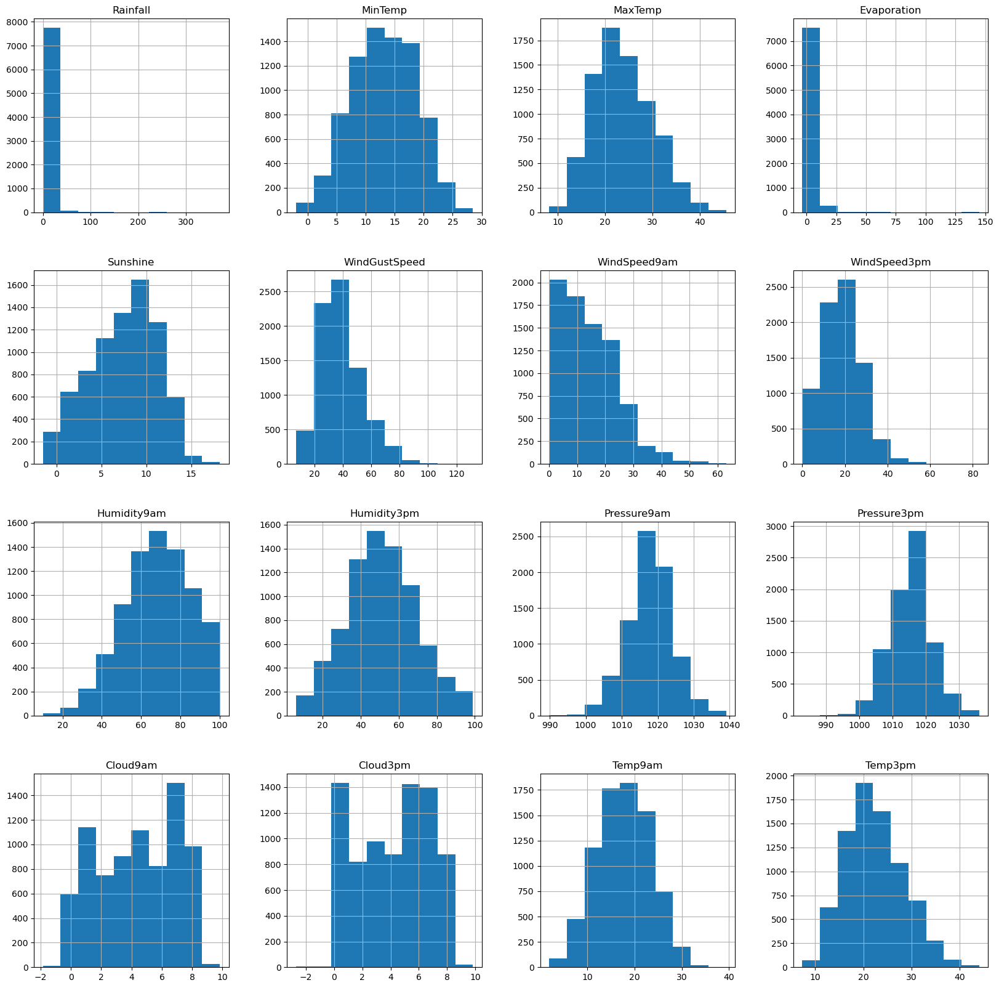

In [47]:
import matplotlib.pyplot as plt
df.hist(figsize=(20,20))
plt.show()

To understand properly we need to review each feature individually but this graph is just for showing the trend with histplot only numeric features shown

# Splitting the columns with categorical and numerica data

In [48]:
# We are defining numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 16 numerical features : ['Rainfall', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

We have 7 categorical features : ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [49]:
df_visualization_continuous=df[['Rainfall', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']].copy()

In [50]:
df_visualization_nominal=df[['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']]

# Visualization of the distribution of the continuous value of the float and int columns.

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings('ignore')

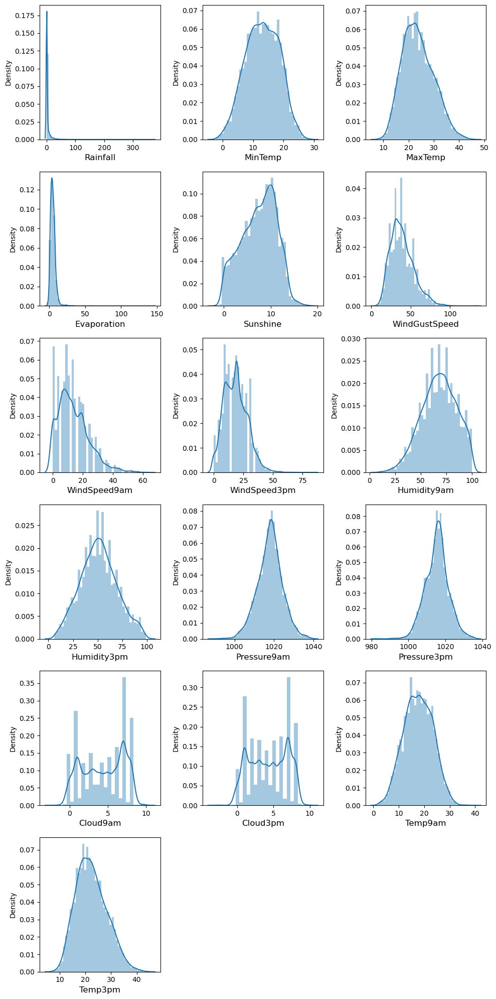

In [52]:
#Lets see how the data is distributed for every column

plt.figure(figsize =(20,25), facecolor = 'white')
plotnumber = 1

for column in df_visualization_continuous:
    if plotnumber <=16:
        ax = plt.subplot(6,3,plotnumber)
        sns.distplot(df_visualization_continuous[column])
        plt.xlabel(column,fontsize = 12)
        
    plotnumber +=1
plt.tight_layout()

# Observations :-
    
   - We see that the columns Evaporation,Windspeed9am,wind gust speed , humidity 9am  having some skewness and need to be treated
   
   - Overall we see that we have a really good dataset with all the features having very normal distribution overall

## Treating the 1st target variable-RainTomorrow where we give Y 1 and we give N 0 - CLASSIFICATION Problem

In [53]:
df['RainTomorrow'].unique() #Checking to see what the columns are in the null columns

array(['No', 'Yes'], dtype=object)

In [54]:
df['RainTomorrow'] = df['RainTomorrow'].factorize(['Y', 'N' ])[0]

In [55]:
df

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,2008-12-01,Albury,W,W,WNW,No,0,0.6,13.4,22.900000,...,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,5.171223,16.9,21.8
1,2008-12-02,Albury,WNW,NNW,WSW,No,0,0.0,7.4,25.100000,...,4.0,22.0,44.0,25.0,1010.6,1007.8,1.039480,1.632026,17.2,24.3
2,2008-12-03,Albury,WSW,W,WSW,No,0,0.0,12.9,25.700000,...,19.0,26.0,38.0,30.0,1007.6,1008.7,2.110778,2.000000,21.0,23.2
3,2008-12-04,Albury,NE,SE,E,No,0,0.0,9.2,28.000000,...,11.0,9.0,45.0,16.0,1017.6,1012.8,0.448392,1.039231,18.1,26.5
4,2008-12-05,Albury,W,ENE,NW,No,0,1.0,17.5,32.300000,...,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8180,2012-04-19,Darwin,SSE,SE,NNW,No,0,0.0,2.8,23.400000,...,13.0,11.0,51.0,24.0,1024.6,1020.3,0.661087,1.486286,10.1,22.4
8181,2012-04-20,Darwin,E,ESE,E,No,1,0.0,3.6,25.300000,...,13.0,9.0,56.0,21.0,1023.5,1019.1,0.519938,1.050539,10.9,24.5
8182,2012-04-21,Darwin,NNE,ENE,N,Yes,0,0.0,5.4,26.900000,...,9.0,9.0,53.0,24.0,1021.0,1016.8,0.754666,1.480901,12.5,26.1
8183,2012-04-22,Darwin,ENE,NNE,NNE,No,0,0.0,7.8,27.000000,...,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0


## Visualizing the Target Variable 

No     5927
Yes    1913
Name: RainTomorrow, dtype: int64


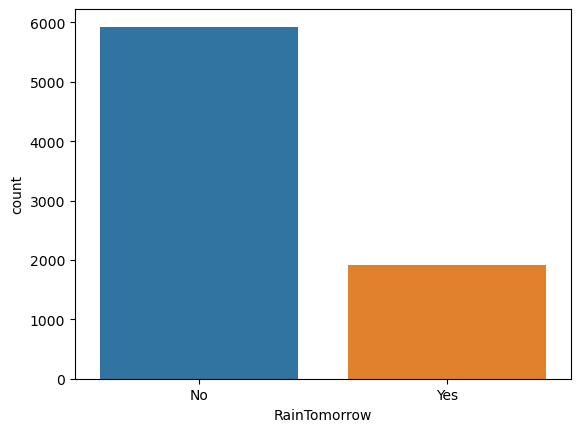

In [56]:
ax = sns.countplot(x='RainTomorrow',data = df_visualization_nominal)
print(df_visualization_nominal['RainTomorrow'].value_counts())

0    5927
1    1913
Name: RainTomorrow, dtype: int64


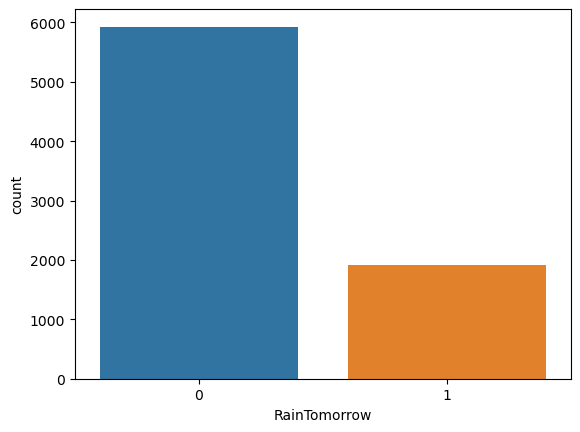

In [57]:
ax = sns.countplot(x='RainTomorrow',data = df)
print(df['RainTomorrow'].value_counts())

In [58]:
import plotly.graph_objs as go
import plotly.offline as py
less_50 = df[(df['RainTomorrow'] != 0)]
more_50 = df[(df['RainTomorrow'] == 0)]

trace = go.Pie(labels = ['ITs not going to rain is No', 'Its going to rain is Yes'], values = df['RainTomorrow'].value_counts(), 
               textfont=dict(size=15),
               marker=dict(colors=['#B9C0C9','yellow'], 
               line=dict(color='#000000', width=1.5)))
layout = dict(title =  'Distribution of RainTomorrow variable')          
fig = dict(data = [trace], layout=layout)
py.iplot(fig) 

Observations :-

We see a huge imbalance in the label column where the applicants whose loan is approved is 76.2% and the ones whose isnt is 23.8% so we need to balance this otherwise the model will be biased 

## Lets graph the data for columns individually so we can make clear findings

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

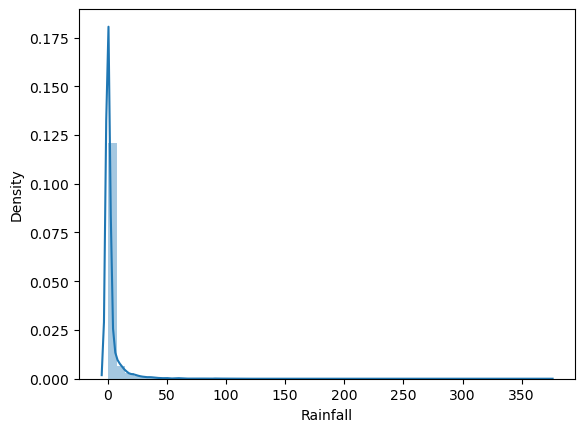

In [59]:
sns.distplot(df_visualization_continuous['Rainfall'],kde=True,)

<AxesSubplot:xlabel='Rainfall', ylabel='Count'>

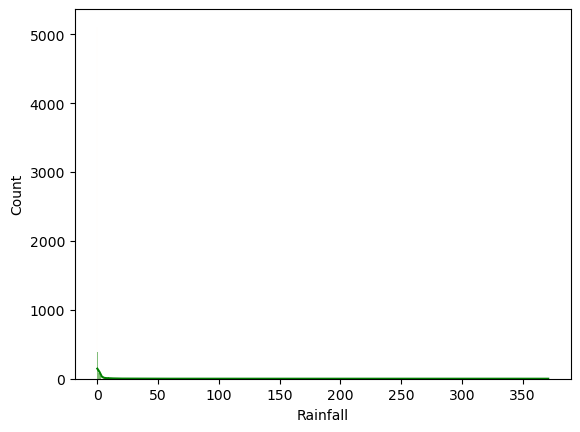

In [60]:
sns.histplot(x=df_visualization_continuous['Rainfall'], ec = "gold", color='g', kde=True)

We see that the data is right skewed and we many outliers in the dataset , we see the max range is 0-350 approx , need to treat to get a better look at the data but as this is a target variable we will only treat it for the 1st label 

<AxesSubplot:xlabel='MinTemp', ylabel='Density'>

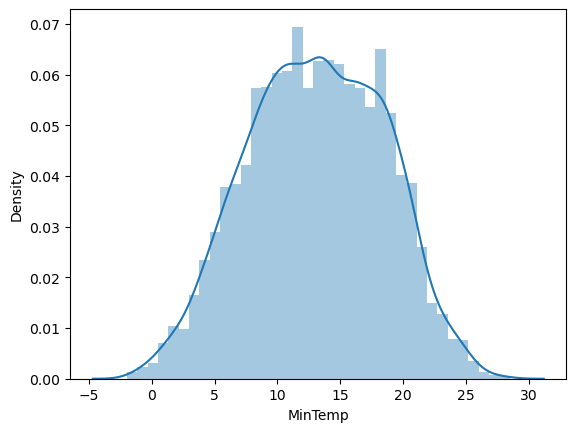

In [63]:
sns.distplot(df['MinTemp'],kde=True,)

<AxesSubplot:xlabel='MaxTemp', ylabel='Density'>

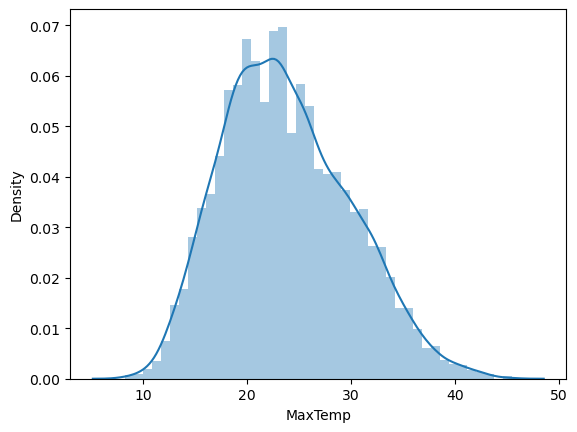

In [67]:
sns.distplot(df['MaxTemp'],kde=True,)

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

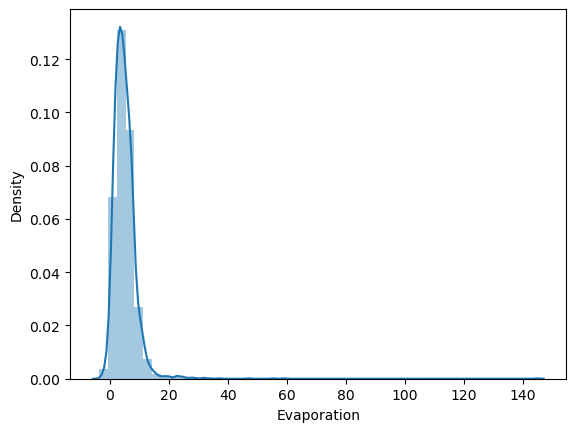

In [71]:
sns.distplot(df['Evaporation'],kde=True,)

<AxesSubplot:xlabel='Sunshine', ylabel='Density'>

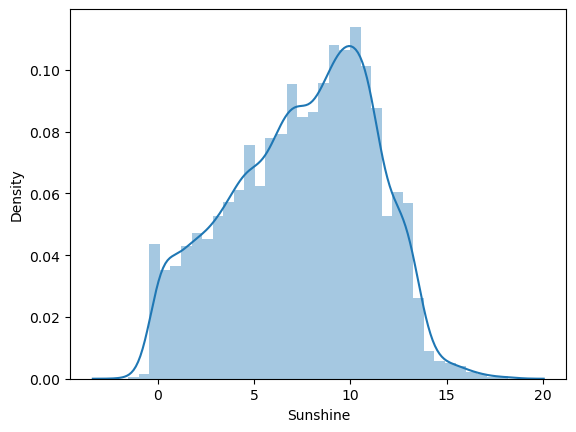

In [75]:
sns.distplot(df['Sunshine'],kde=True,)

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

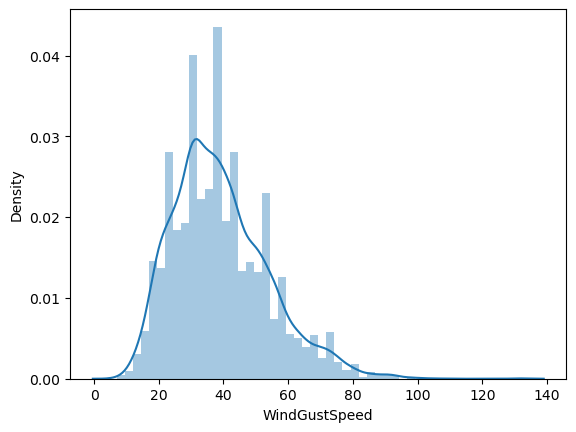

In [79]:
sns.distplot(df['WindGustSpeed'],kde=True,)

Wesee the data is lighly skwed to the right but overall the data has a really equally distributed , the highest range is 25-26 approx

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

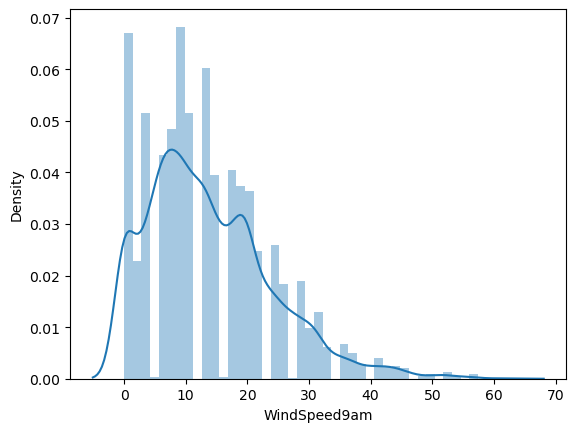

In [83]:
sns.distplot(df['WindSpeed9am'],kde=True,)

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Count'>

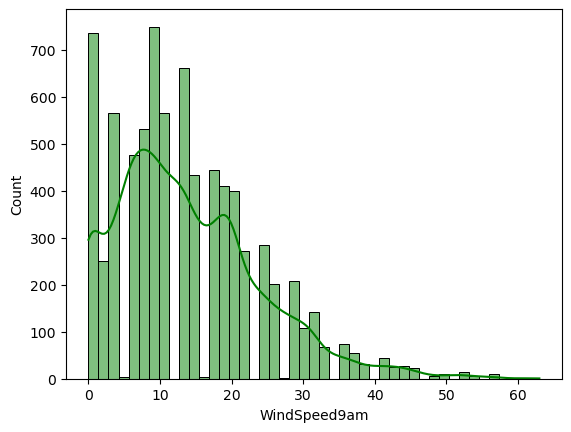

In [84]:
sns.histplot(x=df['WindSpeed9am'], ec = "black", color='g', kde=True)

Here we see right skewed data and we see that the volume of variables are very less, we see the highest here is 0 

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Density'>

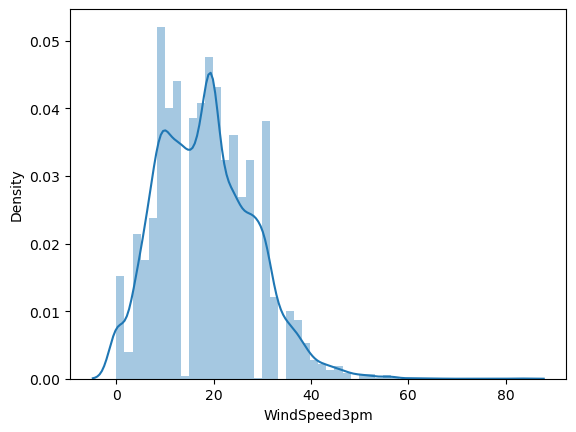

In [87]:
sns.distplot(df['WindSpeed3pm'],kde=True,)

<AxesSubplot:xlabel='Humidity3pm', ylabel='Density'>

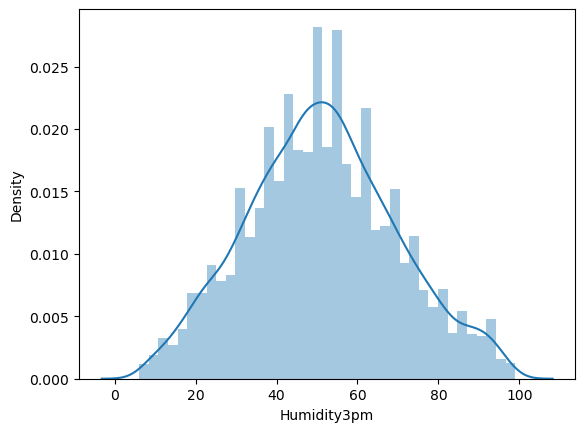

In [95]:
sns.distplot(df['Humidity3pm'],kde=True,)

<AxesSubplot:xlabel='Pressure9am', ylabel='Density'>

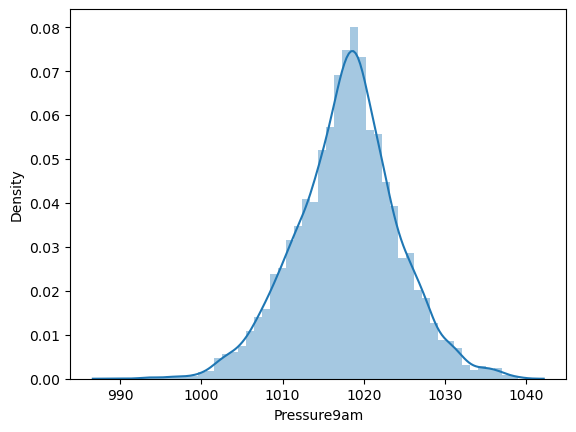

In [99]:
sns.distplot(df['Pressure9am'],kde=True,)

We see the data resenmbles a tree structure which shows a really good distribution of data , we see the highs are between 1010 and 1030

<AxesSubplot:xlabel='Pressure3pm', ylabel='Density'>

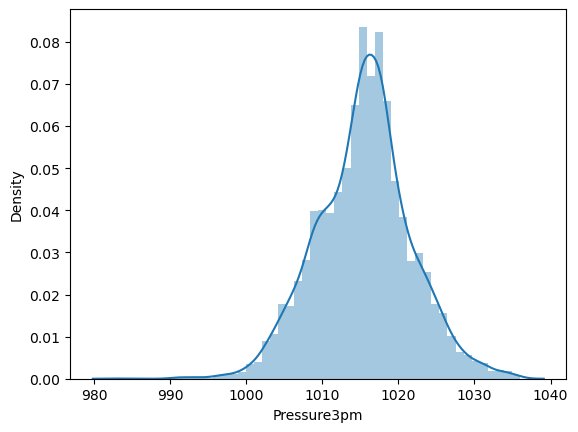

In [103]:
sns.distplot(df['Pressure3pm'],kde=True,)

the daa in the column is left skewed a little , appart from that the majority of the data falls in 1010 to 1020

<AxesSubplot:xlabel='Cloud9am', ylabel='Density'>

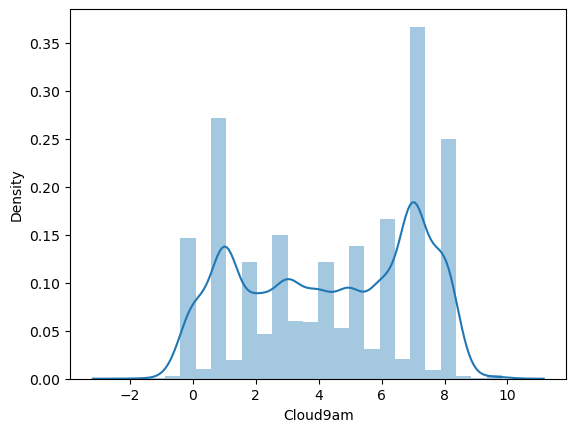

In [107]:
sns.distplot(df['Cloud9am'],kde=True,)

We see that this column has categorical like feature and we see that the highest category is 7 and 1

<AxesSubplot:xlabel='Cloud3pm', ylabel='Density'>

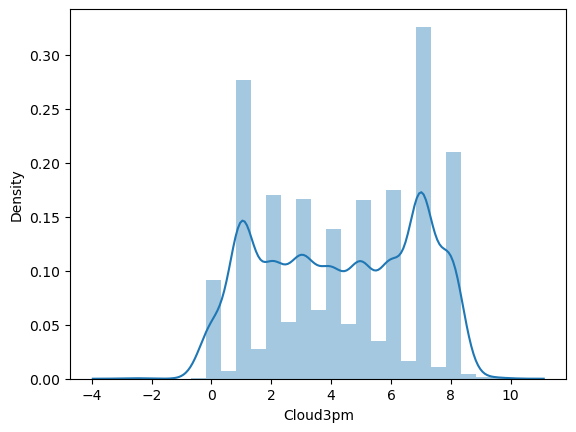

In [111]:
sns.distplot(df['Cloud3pm'],kde=True,)

Here too we see a strong relationship with the previous column an dwe see that 1 and 7 are the highest very identical it is 

<AxesSubplot:xlabel='Temp9am', ylabel='Density'>

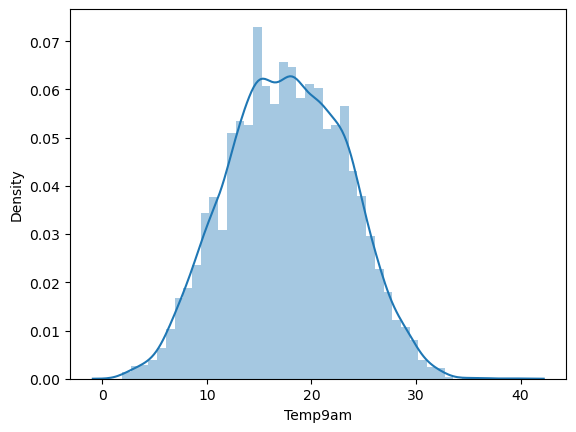

In [115]:
sns.distplot(df['Temp9am'],kde=True,)

We see that the data is noramally distributed , we see the hig range falls between 15 and 25

<AxesSubplot:xlabel='Temp3pm', ylabel='Density'>

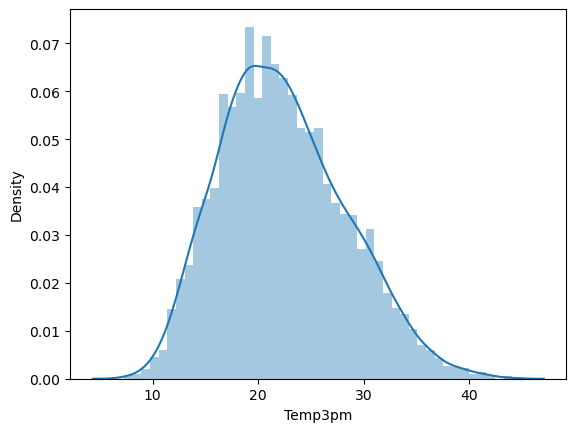

In [119]:
sns.distplot(df['Temp3pm'],kde=True,)

Same as the previous column we see the highs are 20 to 27 approx here 

## We see a number of observation in the pairplot , but the relationship is very hard to pinpoint so we will need to plot different relationship plots to find the actual relationship between the columns

# Visualization of the categorical features

Date needs to be treated is an index so we wont visualize than as all values are unique to each other. and will not be usful till we treat it to see realtionship with other features and label 

Melbourne       1442
PerthAirport    1204
Williamtown     1136
Albury           889
Newcastle        804
CoffsHarbour     609
Brisbane         569
Penrith          476
Wollongong       464
Adelaide         198
Darwin            49
Name: Location, dtype: int64


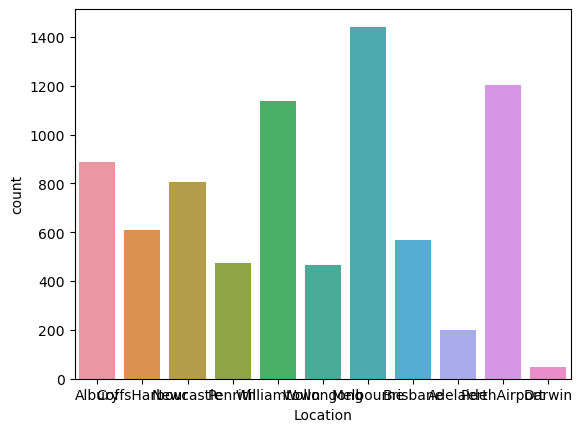

In [124]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='Location',data = df,)
print(df['Location'].value_counts())

We see different locations in Australia and we see that the recording made in the dataset , we see the highest a Perth Airport

<AxesSubplot:xlabel='Location', ylabel='count'>

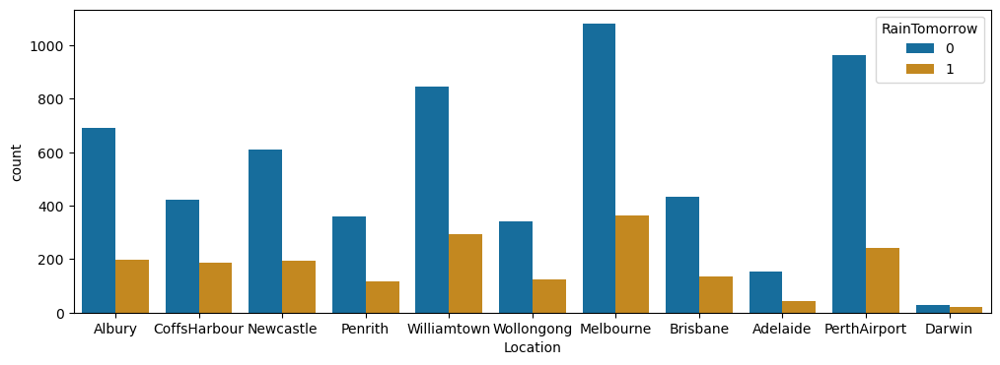

In [125]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Location", hue="RainTomorrow", data=df, palette="colorblind")

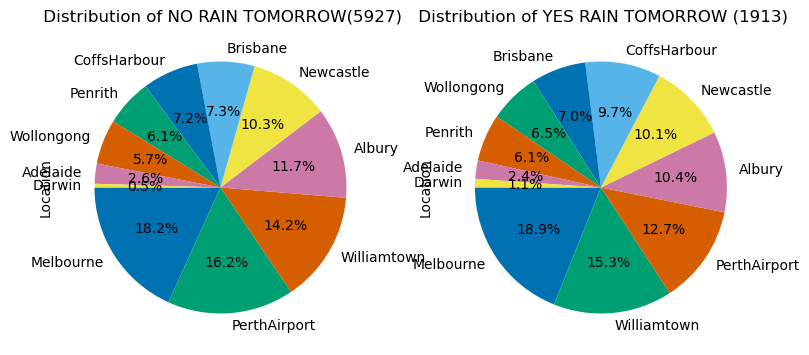

In [126]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["Location"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["Location"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

We see that the perth airport has the highest instances of rain compared to the rest and melbourne as well coming in close to the leader

N      1591
SW      547
SSE     538
S       531
WNW     502
E       498
W       485
WSW     481
SE      436
ENE     383
SSW     381
NW      350
NE      343
NNE     326
ESE     256
NNW     192
Name: WindGustDir, dtype: int64


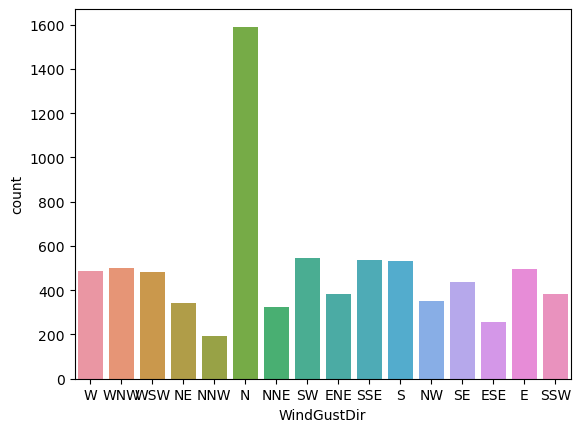

In [127]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='WindGustDir',data = df)
print(df['WindGustDir'].value_counts())

WE see that the highest direction of wind is North here almost equal to half of the rest

<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

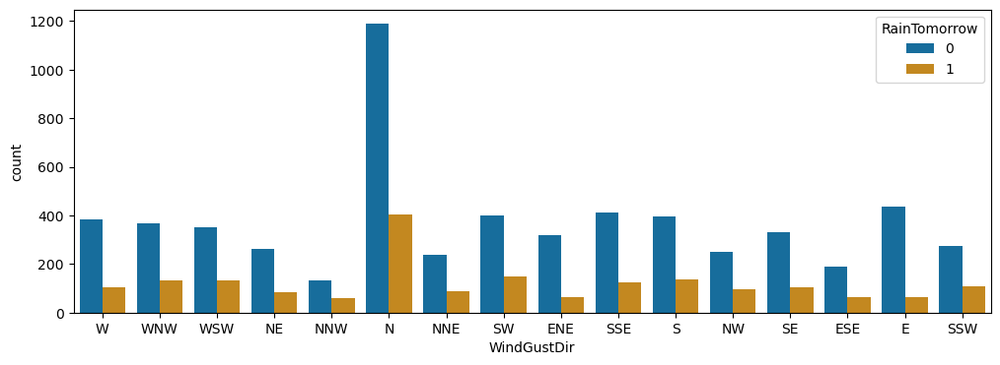

In [128]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindGustDir", hue="RainTomorrow", data=df, palette="colorblind")

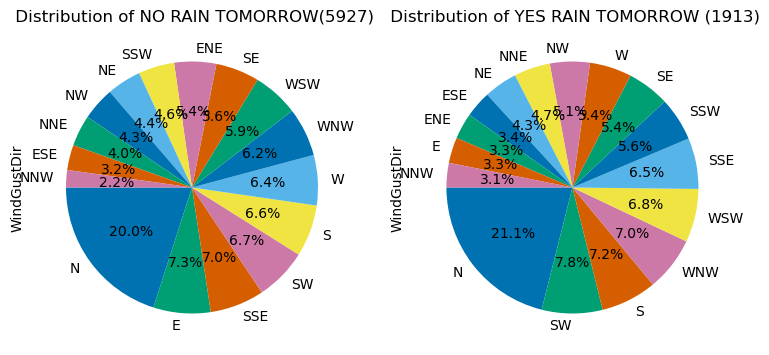

In [129]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["WindGustDir"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["WindGustDir"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

As we saw in the countplot the N wind direction has the highest chance of rain by a huge margin

N      1639
SW      672
NW      601
WSW     507
WNW     462
SSW     441
SE      418
ENE     412
NNE     405
W       396
NE      379
S       363
E       338
SSE     337
NNW     257
ESE     213
Name: WindDir9am, dtype: int64


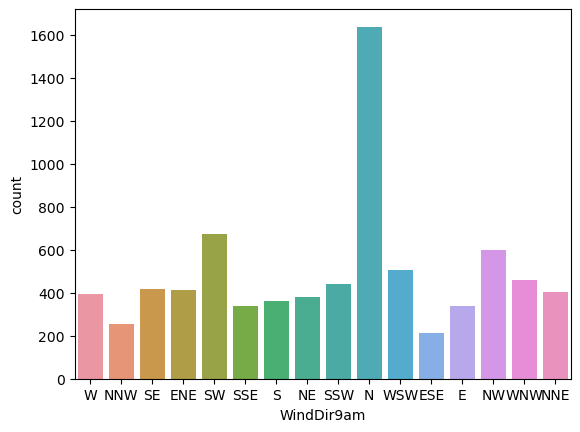

In [130]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='WindDir9am',data = df)
print(df['WindDir9am'].value_counts())

We see similar characteristiccs like the previous feature where N north is the highest by a long difference

<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

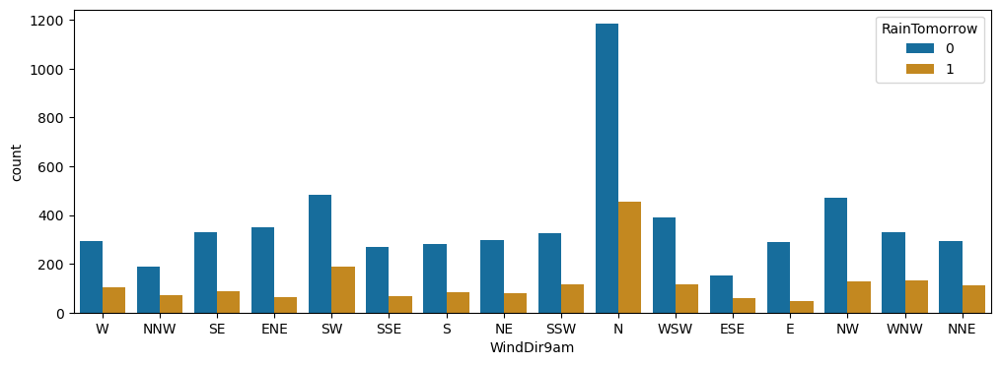

In [131]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindDir9am", hue="RainTomorrow", data=df, palette="colorblind")

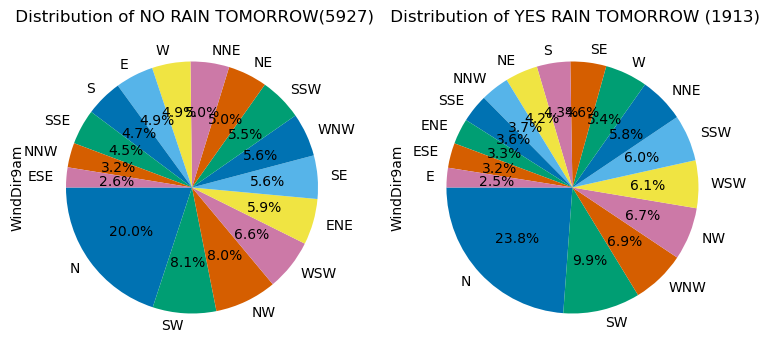

In [132]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["WindDir9am"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["WindDir9am"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

Again we see that the N North category has the highest chance and has the highest number as well in the column

SE     1058
S       676
SSE     589
WSW     557
NE      530
N       477
SW      472
WNW     451
W       446
ESE     431
NW      428
E       404
ENE     377
SSW     351
NNE     351
NNW     242
Name: WindDir3pm, dtype: int64


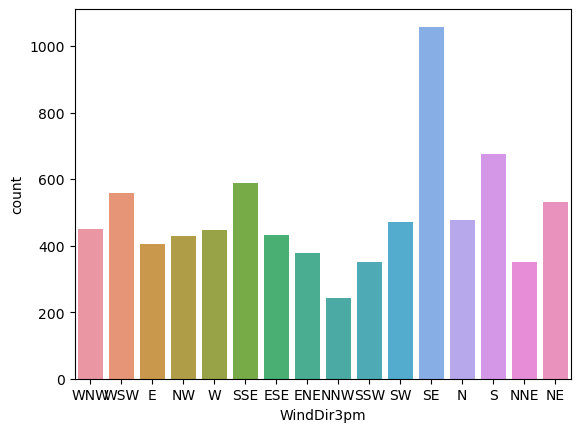

In [133]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='WindDir3pm',data = df_visualization_nominal)
print(df_visualization_nominal['WindDir3pm'].value_counts())

Here we see a slight change where the highest is South East

<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

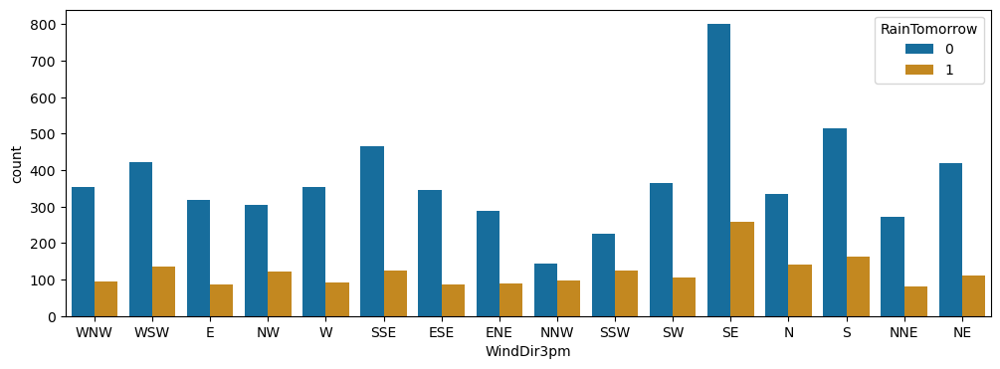

In [134]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindDir3pm", hue="RainTomorrow", data=df, palette="colorblind")

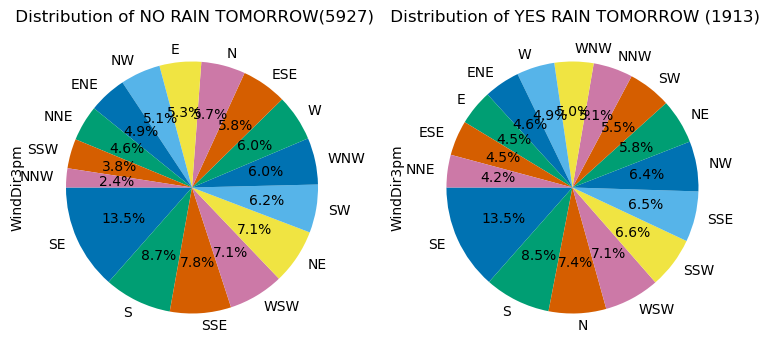

In [135]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["WindDir3pm"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["WindDir3pm"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

Wesee that the SE being the highest has more instances of rain compared to the rest in thsi analysis

No     5893
Yes    1947
Name: RainToday, dtype: int64


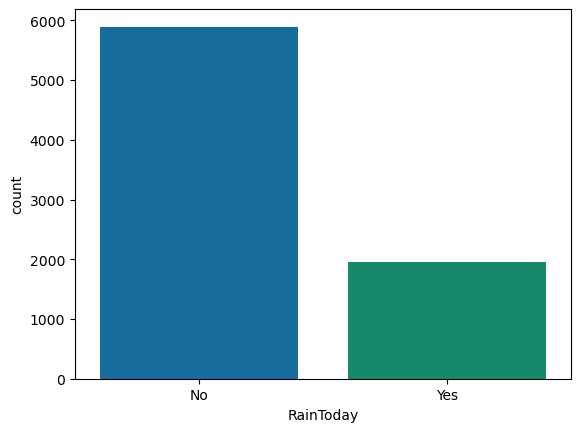

In [136]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='RainToday',data = df_visualization_nominal)
print(df_visualization_nominal['RainToday'].value_counts())

We see strikingly accurate and same results with the label where the no of times it doesnt rains much much higher that the times it rains 

<AxesSubplot:xlabel='RainToday', ylabel='count'>

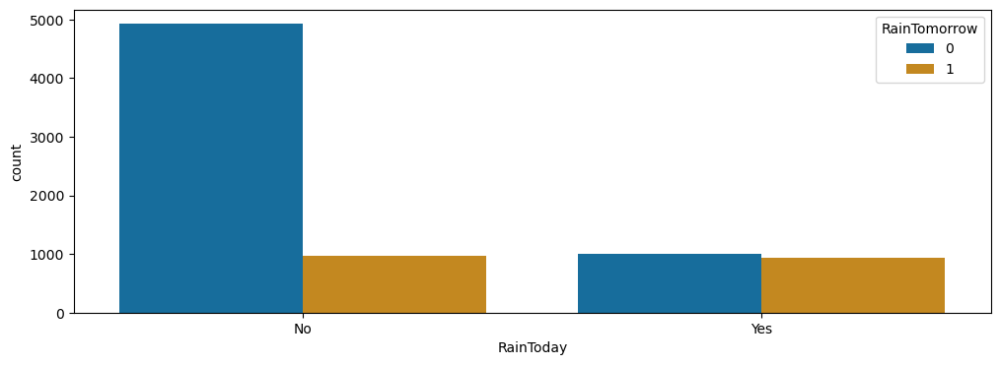

In [137]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="RainToday", hue="RainTomorrow", data=df, palette="colorblind")

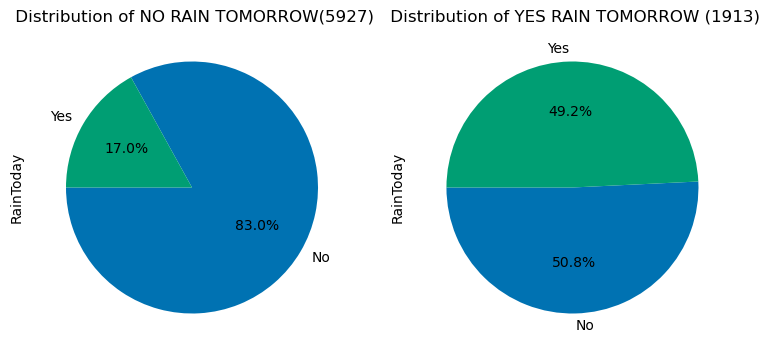

In [138]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["RainToday"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["RainToday"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

We see that the yes is strikingly similar to the label having the same metric this column may be the highest correlation with the label

# Encoding the categorical Features to numerical features

### Treating the Data columsn and extracting the month and year 

In [139]:
df["Date_month"] = pd.to_datetime(df["Date"], format = "%Y/%m/%d").dt.month # extracting the month

In [140]:
df["Date_year"] = pd.to_datetime(df["Date"], format = "%Y/%m/%d").dt.year # extracting the year

In [141]:
df.shape

(7840, 25)

In [142]:
df.drop(columns = ['Date'],inplace=True)

In [143]:
df.dtypes

Location          object
WindGustDir       object
WindDir9am        object
WindDir3pm        object
RainToday         object
RainTomorrow       int64
Rainfall         float64
MinTemp          float64
MaxTemp          float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
Date_month         int64
Date_year          int64
dtype: object

In [144]:
from sklearn.preprocessing import LabelEncoder
enc=LabelEncoder()

In [145]:
for i in df.columns:
    if df[i].dtypes == "object":
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))


In [146]:
df.dtypes

Location           int32
WindGustDir        int32
WindDir9am         int32
WindDir3pm         int32
RainToday          int32
RainTomorrow       int64
Rainfall         float64
MinTemp          float64
MaxTemp          float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
Date_month         int64
Date_year          int64
dtype: object

We have converted the categorical data to numerical data we can move ahead to the next step

# Visualizing the relationship between the features and the 1st  target variable - Raintomorrow

In [147]:
#Divide data into features and label

x = df.drop(columns = ['RainTomorrow'])
y = df['RainTomorrow']

In [148]:
x

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,Rainfall,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,1,13,13,14,0,0.6,13.4,22.900000,5.137809,6.580611,...,71.0,22.0,1007.7,1007.1,8.000000,5.171223,16.9,21.8,12,2008
1,1,14,6,15,0,0.0,7.4,25.100000,6.000039,12.412480,...,44.0,25.0,1010.6,1007.8,1.039480,1.632026,17.2,24.3,12,2008
2,1,15,13,15,0,0.0,12.9,25.700000,7.284111,11.772105,...,38.0,30.0,1007.6,1008.7,2.110778,2.000000,21.0,23.2,12,2008
3,1,4,9,0,0,0.0,9.2,28.000000,5.393398,12.880993,...,45.0,16.0,1017.6,1012.8,0.448392,1.039231,18.1,26.5,12,2008
4,1,13,1,7,0,1.0,17.5,32.300000,5.389607,6.370655,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8180,4,10,9,6,0,0.0,2.8,23.400000,4.124527,11.922682,...,51.0,24.0,1024.6,1020.3,0.661087,1.486286,10.1,22.4,4,2012
8181,4,0,2,0,0,0.0,3.6,25.300000,3.803778,12.562014,...,56.0,21.0,1023.5,1019.1,0.519938,1.050539,10.9,24.5,4,2012
8182,4,5,1,3,1,0.0,5.4,26.900000,5.723515,12.345127,...,53.0,24.0,1021.0,1016.8,0.754666,1.480901,12.5,26.1,4,2012
8183,4,1,5,5,0,0.0,7.8,27.000000,5.882395,11.123465,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,4,2012


In [149]:
y

0       0
1       0
2       0
3       0
4       0
       ..
8180    0
8181    1
8182    0
8183    0
8184    1
Name: RainTomorrow, Length: 7840, dtype: int64

# Scatter plot

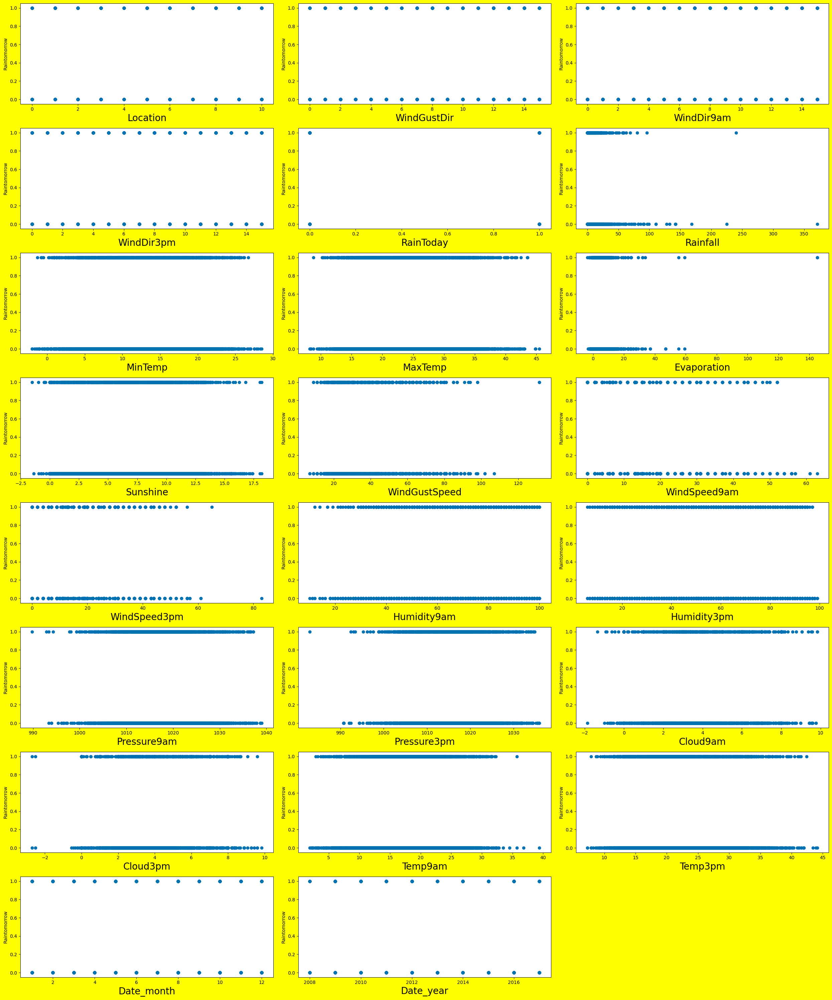

In [150]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'yellow')
plotnumber = 1

for column in x:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Raintomorrow',fontsize = 10)
    plotnumber +=1
plt.tight_layout()


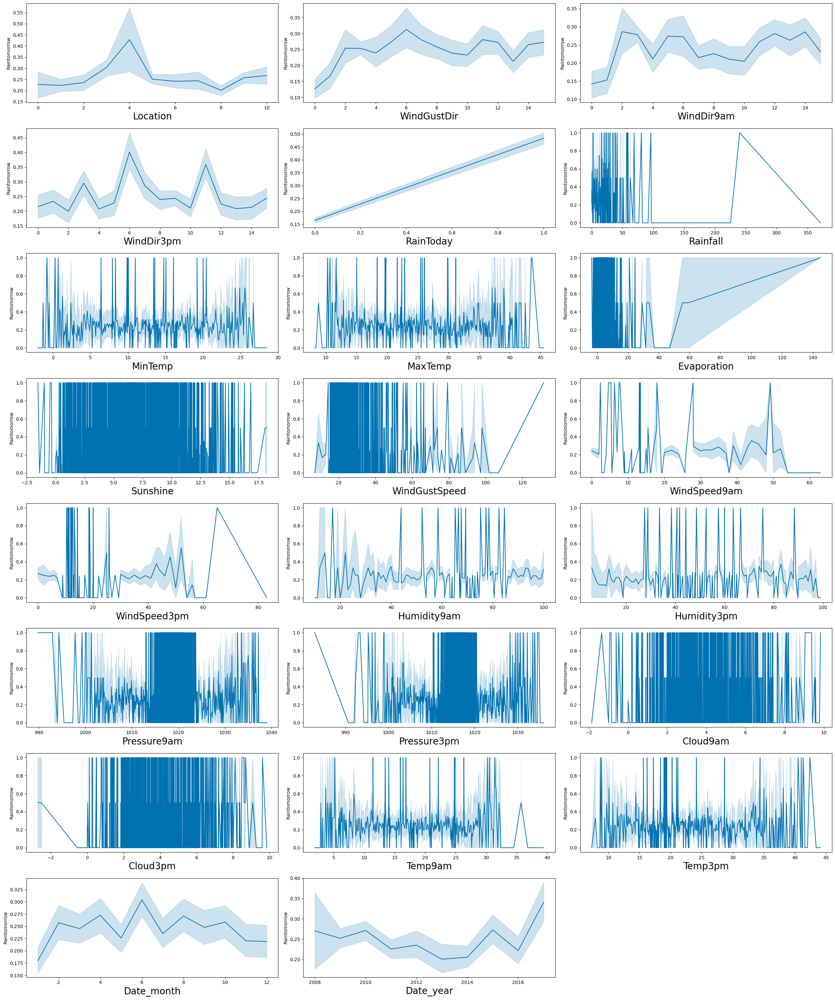

In [151]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'white')
plotnumber = 1

for column in x:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        sns.lineplot(x[column],y)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Raintomorrow',fontsize = 10)
    plotnumber +=1
plt.tight_layout()

We see that the stripplot is showing use binary relationship as its a classification problem , but the line plot is showing some good graphs we see some positive relationships inlocation in windgustdir, winddir9am ans winddir3pm and month and day the other columns dont show a up or down trend

# Visualizing the relationship between the features and the 2nd  target variable - Rainfall

In [152]:
#Divide data into features and label

x1 = df.drop(columns = ['Rainfall'])
y1 = df['Rainfall']

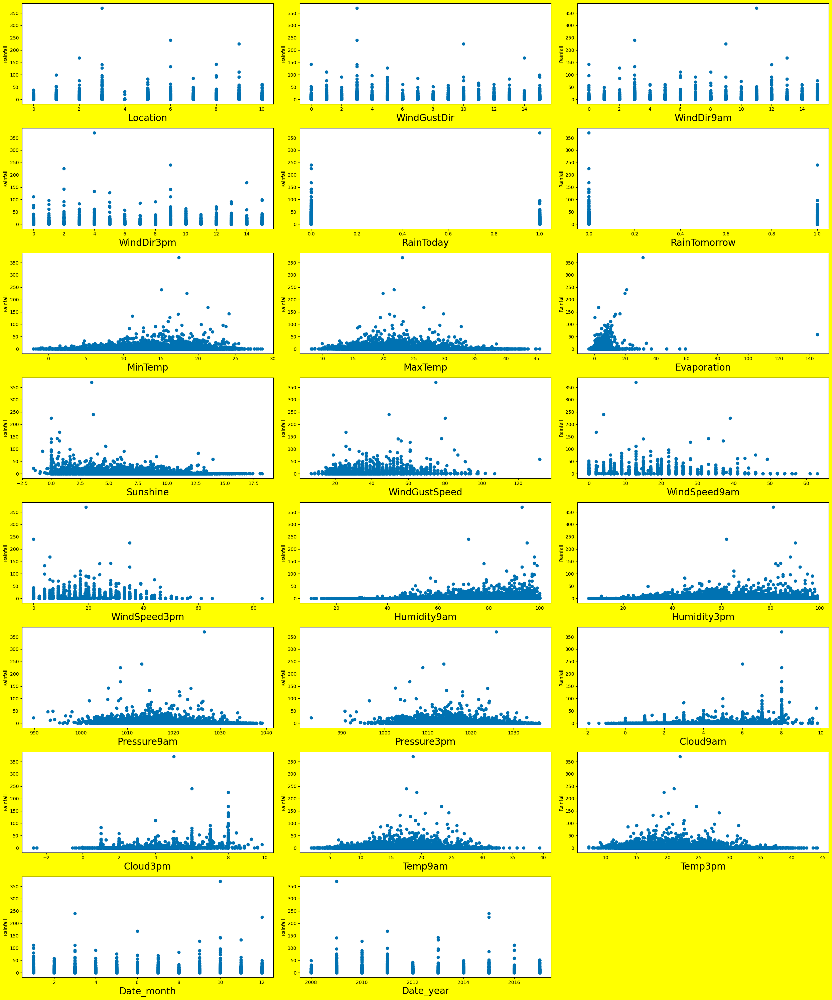

In [153]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'yellow')
plotnumber = 1

for column in x1:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        plt.scatter(x1[column],y1)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Rainfall',fontsize = 10)
    plotnumber +=1
plt.tight_layout()


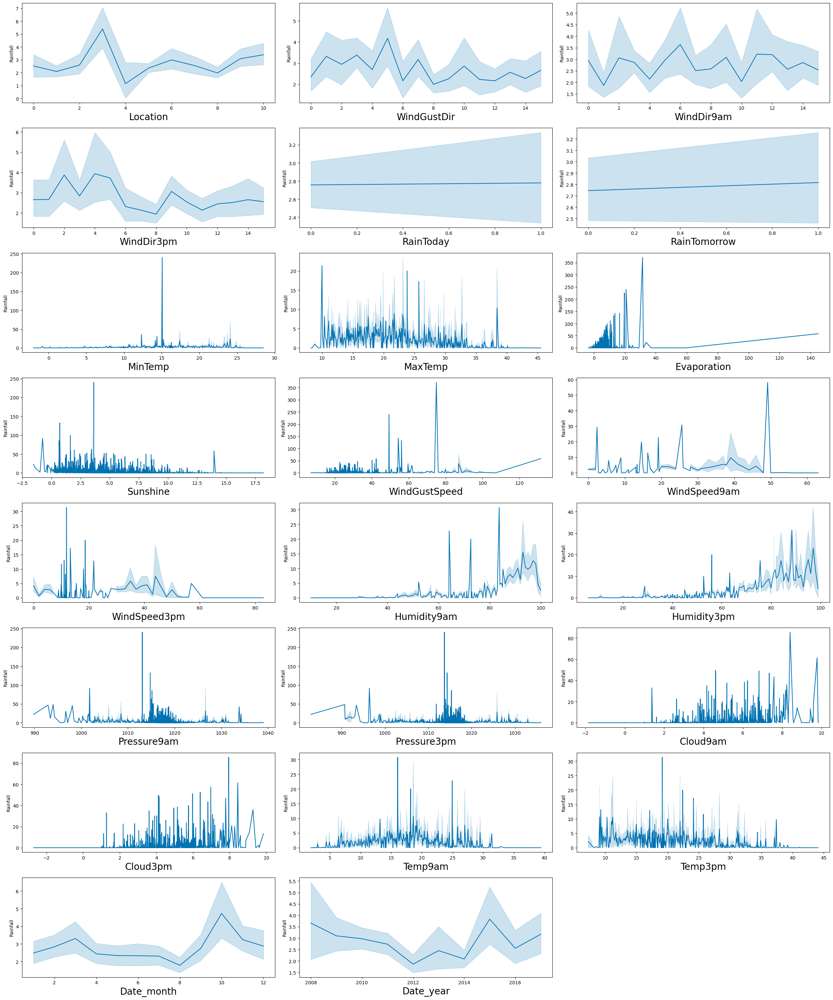

In [154]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'white')
plotnumber = 1

for column in x1:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        sns.lineplot(x1[column],y1)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Rainfall',fontsize = 10)
    plotnumber +=1
plt.tight_layout()

# EDA

### Describing the Dataset

In [155]:
df.describe()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,Evaporation,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
count,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,...,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000,7840.000000
mean,5.601020,7.286607,7.298087,7.883291,0.248342,0.244005,2.762985,13.075613,23.788896,5.005634,...,67.728573,51.220735,1017.935302,1015.462422,4.367241,4.326122,17.700556,22.366401,6.350893,2012.063010
std,2.929368,4.707478,4.598989,4.425140,0.432079,0.429523,10.261708,5.422294,6.131865,4.370428,...,16.918444,18.476775,6.314413,6.227667,2.658754,2.524009,5.642299,5.967242,3.436180,2.491032
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2.000000,8.200000,-3.600968,...,10.000000,6.000000,989.800000,982.900000,-1.855370,-2.705968,1.900000,7.300000,1.000000,2008.000000
25%,3.000000,3.000000,3.000000,4.000000,0.000000,0.000000,0.000000,9.100000,19.200000,2.600000,...,56.000000,39.000000,1014.100000,1011.400000,2.000000,2.000000,13.600000,18.000000,3.000000,2010.000000
50%,6.000000,7.000000,7.000000,9.000000,0.000000,0.000000,0.000000,13.200000,23.200000,4.442289,...,68.000000,51.000000,1018.200000,1015.700000,4.614250,4.326918,17.700000,21.800000,6.000000,2011.000000
75%,8.000000,12.000000,12.000000,11.000000,0.000000,0.000000,1.000000,17.300000,28.000000,6.667934,...,80.000000,63.000000,1021.800000,1019.100000,7.000000,7.000000,21.900000,26.300000,9.000000,2014.000000
max,10.000000,15.000000,15.000000,15.000000,1.000000,1.000000,371.000000,28.500000,45.500000,145.000000,...,100.000000,99.000000,1039.000000,1036.000000,9.827701,9.842535,39.400000,44.100000,12.000000,2017.000000


# Observations:-

- As we have mentioned in the previous notes with the df. describe , we see that there are outliers and extreme values in some of the coulmns which  need to be treated 

# Visualization of the Data Properties


<AxesSubplot:>

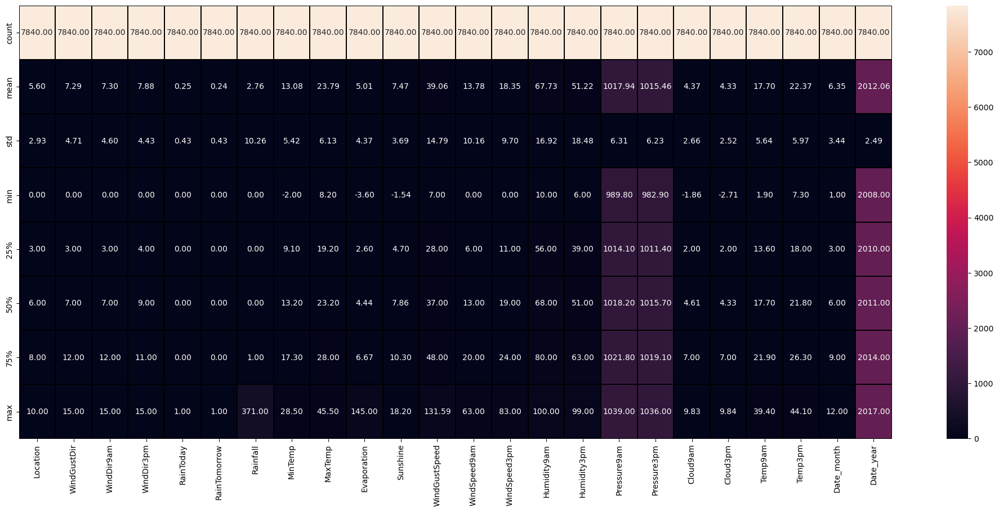

In [156]:
#Lets see how the data is distributed for every column

import matplotlib.pyplot as plt
plt.figure(figsize=(25,10))
sns.heatmap(df.describe(),annot=True,linewidths=0.1,linecolor="black",fmt='0.2f')

In [157]:
df.skew()

Location         -0.289826
WindGustDir       0.104638
WindDir9am        0.170483
WindDir3pm       -0.134313
RainToday         1.165169
RainTomorrow      1.192300
Rainfall         13.042931
MinTemp          -0.068451
MaxTemp           0.382378
Evaporation      10.515761
Sunshine         -0.236298
WindGustSpeed     0.799909
WindSpeed9am      0.937256
WindSpeed3pm      0.507593
Humidity9am      -0.258932
Humidity3pm       0.122242
Pressure9am      -0.092297
Pressure3pm      -0.049291
Cloud9am         -0.156208
Cloud3pm         -0.086482
Temp9am          -0.005717
Temp3pm           0.397760
Date_month        0.068274
Date_year         0.416073
dtype: float64

We see tat we have skewness of more than 0.55 in columns like Evaporation,windgustdir and winddir9pm , etc , which needs to be treated using the zscore , and rainfall is one of the labels so we will only treat it with the ascore as if we manipulate it the results for the model for the regression will be unfair

# Correlation of the columns with the  target variables 

In [158]:
df.corr()['RainTomorrow'].sort_values()

Sunshine        -0.027898
MaxTemp         -0.017265
Temp3pm         -0.015676
Temp9am         -0.005716
Evaporation     -0.004369
Date_year       -0.002687
Location        -0.002003
Pressure9am     -0.001547
WindDir3pm      -0.000385
Pressure3pm      0.001288
WindSpeed3pm     0.002747
Rainfall         0.002970
WindGustSpeed    0.003380
Date_month       0.007152
WindSpeed9am     0.010382
MinTemp          0.011443
Cloud3pm         0.016991
Cloud9am         0.017686
WindDir9am       0.026139
Humidity9am      0.028991
Humidity3pm      0.034429
WindGustDir      0.043893
RainToday        0.320948
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

In [159]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.226841
Temp3pm         -0.092458
MaxTemp         -0.089018
Pressure9am     -0.079034
Pressure3pm     -0.033508
WindGustDir     -0.027847
WindDir3pm      -0.023395
Temp9am         -0.007504
Date_year       -0.006923
Location        -0.000549
RainToday        0.000934
RainTomorrow     0.002970
WindDir9am       0.004870
WindSpeed3pm     0.015990
Date_month       0.018996
WindSpeed9am     0.051146
MinTemp          0.088647
WindGustSpeed    0.100947
Evaporation      0.116174
Cloud3pm         0.175389
Cloud9am         0.209412
Humidity9am      0.230584
Humidity3pm      0.241047
Rainfall         1.000000
Name: Rainfall, dtype: float64

### We see that there are similarities between the variables correlation we see that the variables sunshine, all temp columns, date columns , pressure columns have negative relationship . the columns raintoday humidity,cloud,evaporation,wind columns all have positive relationship with the targets


## Heatmap of Correlation of the columns within the Columns or Features and Target

<AxesSubplot:>

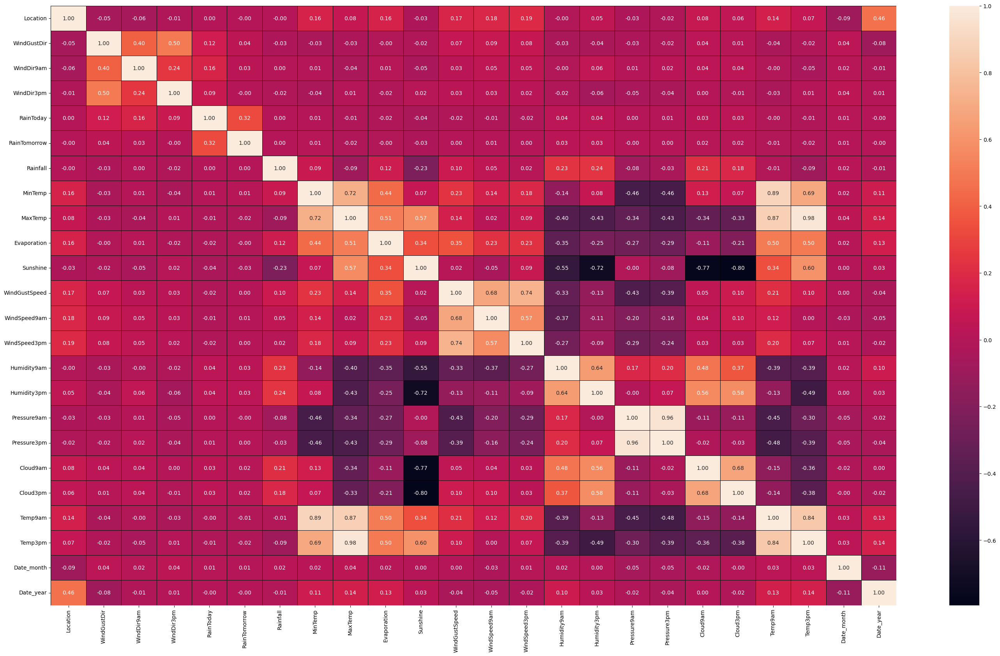

In [160]:
import seaborn as sns
import matplotlib.pyplot as plt
#size of canvas
plt.figure(figsize=(35,20))
sns.heatmap(df.corr(),annot=True, linewidths=0.5,linecolor='black', fmt='.2f')

### Observations from the heatmap

- we see that there there is high multicollinearity between Maxtemp and Temp3pm, thats the highest @ 98%, then Mintemp and Temp 9am is 2nd @ 89%,3rd is maxtemp and temp9am @87%, but these columns impact on the target is very less so we may remove them later after PCA analysis


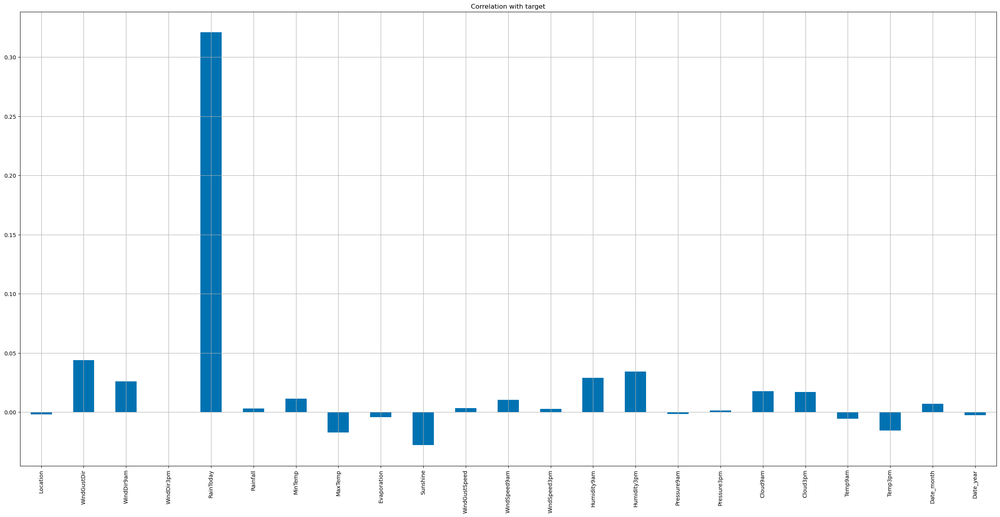

In [161]:
# Plotting a barplot to see th relationship with 1st label in a better way

df.drop('RainTomorrow', axis=1).corrwith(df.RainTomorrow).plot(kind='bar', grid=True,figsize=(32,15),
                                                  title='Correlation with target')

plt.show()

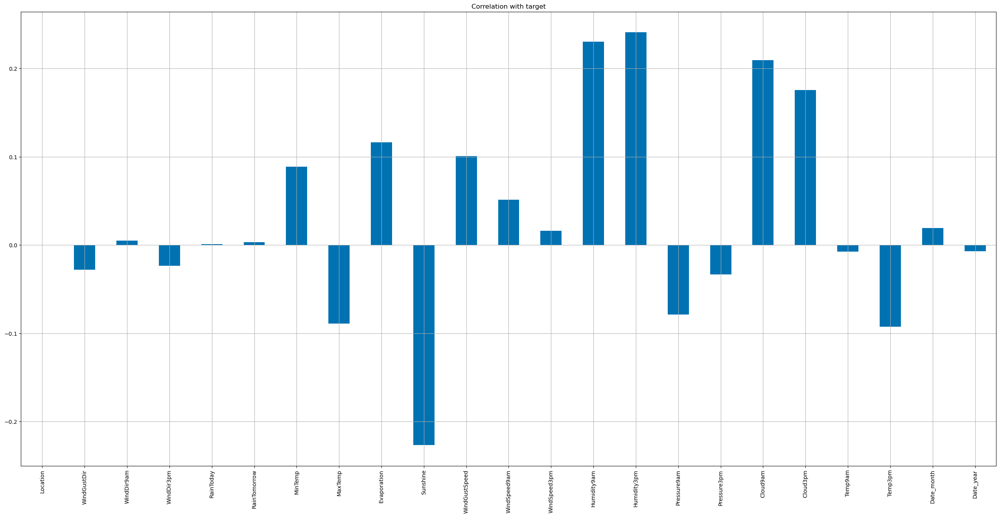

In [162]:
# Plotting a barplot to see th relationship with 1st label in a better way

df.drop('Rainfall', axis=1).corrwith(df.Rainfall).plot(kind='bar', grid=True,figsize=(32,15),
                                                  title='Correlation with target')

plt.show()

We see the values we have seen in the corr table represented graphically .
- For RainTomorrow we see that humidity and cloud columns are most impactful
- For Rain fall we see that raintoday and tommorrow the highest and humidity and cloud trailing behind

# Using SelectKBest Feature Selection Method - Target - Raintomorrow

Select KBest use f_classif function to find the best features, where f_classif uses Anova Test

In [163]:
# Again we Divide data into features and label

X = df.drop(columns = ['RainTomorrow'])
y = df['RainTomorrow']

In [164]:
from sklearn.feature_selection import SelectKBest, f_classif

In [165]:
best_features = SelectKBest(score_func = f_classif, k=23)

fit = best_features.fit(X,y)

df_scores = pd.DataFrame(fit.scores_)

df_columns = pd.DataFrame(X.columns)


#concatenate dataframes

feature_scores = pd.concat([df_columns, df_scores], axis = 1)

feature_scores.columns = ['Feature_name', 'Score']   #name output columns

print(feature_scores.nlargest(23,'Score'))  #Print Best features

     Feature_name       Score
4       RainToday  900.088174
1     WindGustDir   15.130083
14    Humidity3pm    9.301603
13    Humidity9am    6.593361
9        Sunshine    6.104936
2      WindDir9am    5.358930
17       Cloud9am    2.452336
7         MaxTemp    2.337148
18       Cloud3pm    2.263494
20        Temp3pm    1.926480
6         MinTemp    1.026468
11   WindSpeed9am    0.844970
21     Date_month    0.400897
19        Temp9am    0.256099
8     Evaporation    0.149602
10  WindGustSpeed    0.089535
5        Rainfall    0.069128
12   WindSpeed3pm    0.059163
22      Date_year    0.056599
0        Location    0.031433
15    Pressure9am    0.018761
16    Pressure3pm    0.012998
3      WindDir3pm    0.001161


### We see that the feature Humidity3pm is the best  as the score they have are greater than 1955 approx which is really high, Even Sunshine is really high, the rest of them have a good impact or influence on the Raintomorrow label, but we are only performing this step as a way to analyze the data even further , We see that correlation showed different features and Kbest is showing different so we will move on and we will do some more analysis

# Using SelectKBest Feature Selection Method - Target - Rainfall

Select KBest use f_classif function to find the best features, where f_classif uses Anova Test

In [166]:
# Again we Divide data into features and label

X1 = df.drop(columns = ['Rainfall'])
y1 = df['Rainfall']

In [167]:
from sklearn.feature_selection import SelectKBest, f_classif

In [168]:
best_features = SelectKBest(score_func = f_classif, k=23)

fit = best_features.fit(X1,y1)

df_scores = pd.DataFrame(fit.scores_)

df_columns = pd.DataFrame(X1.columns)


#concatenate dataframes

feature_scores = pd.concat([df_columns, df_scores], axis = 1)

feature_scores.columns = ['Feature_name', 'Score']   #name output columns

print(feature_scores.nlargest(23,'Score'))  #Print Best 4 features

     Feature_name      Score
8     Evaporation  15.562169
13    Humidity9am   8.643234
9        Sunshine   8.426499
14    Humidity3pm   8.256602
17       Cloud9am   6.569847
18       Cloud3pm   5.369697
20        Temp3pm   3.666790
7         MaxTemp   3.456540
15    Pressure9am   2.489971
10  WindGustSpeed   2.272725
16    Pressure3pm   1.911192
12   WindSpeed3pm   1.720208
22      Date_year   1.699164
19        Temp9am   1.652553
11   WindSpeed9am   1.538803
6         MinTemp   1.287320
1     WindGustDir   1.261641
0        Location   1.239830
5    RainTomorrow   1.157145
3      WindDir3pm   1.094107
21     Date_month   1.079967
4       RainToday   0.979009
2      WindDir9am   0.940330


## We see that the best is Raintoday just as we saw in the correlation , followed by evaporation and sunshine , but overall this label does not show strong relationship with the columns or features 

# Variance Inflation Factor

Checking for Multicollinearity problem to see if one feature is dependent on the other , we need to scale the dat first using MINMAX Scalar

In [169]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()

In [170]:
X_scaled = mms.fit_transform(X)

In [171]:
X_scaled.shape

(7840, 23)

In [172]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(X_scaled, i) for i in range(X_scaled.shape[1])]
vif["Features"] = X.columns

#chck Values
vif

,vif,Features
0,6.621603,Location
1,5.229928,WindGustDir
2,4.363931,WindDir9am
3,5.658339,WindDir3pm
4,1.377024,RainToday
5,1.269042,Rainfall
6,76.695901,MinTemp
7,253.665317,MaxTemp
8,8.563854,Evaporation
9,31.428826,Sunshine


We see a high variance in the columns Mintemp,maxtemp,sunshine, windgustspeed, windspeed,humidity pressure and temp 9am & 3pm as well, which needs to be treated

In [173]:
X_scaled1 = mms.fit_transform(X1)

In [174]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(X_scaled1, i) for i in range(X_scaled1.shape[1])]
vif["Features"] = X1.columns

#chck Values
vif

,vif,Features
0,6.611035,Location
1,5.229913,WindGustDir
2,4.368107,WindDir9am
3,5.665089,WindDir3pm
4,1.534050,RainToday
5,1.480307,RainTomorrow
6,76.710076,MinTemp
7,252.703867,MaxTemp
8,8.255338,Evaporation
9,30.917540,Sunshine


Same as the earlier observation we see many columns with high vif score which need to be treated of outliers

# Principal Component Analysis (PCA)

It is a dimension reduction technique and not a feature selection one.

and we are going to apply on the features only , it is mainly used if there are too many features and no correlation with the target

but its the final analysis we are going to do to chcek for multicollinearity problem

In [175]:
from sklearn.decomposition import PCA

In [176]:
pca = PCA()

In [177]:
pca.fit_transform(X_scaled) #To scale the data with PCA so we can plot the graph to see whats the coverage 

array([[ 2.61438641e-01,  5.14567335e-02, -9.10484573e-01, ...,
         1.50586597e-02, -1.53952440e-02,  1.82980408e-02],
       [ 4.53721076e-02,  5.89520693e-01, -7.98071306e-01, ...,
        -5.00482847e-04,  1.20339534e-02, -1.12850883e-02],
       [ 2.32632623e-01,  6.17777311e-01, -9.77013602e-01, ...,
         1.51863940e-02, -3.23739855e-02, -1.10768524e-02],
       ...,
       [ 2.32237181e-01,  4.21334059e-01,  7.58416984e-01, ...,
        -3.42594569e-03, -3.50065036e-03, -2.02067672e-02],
       [-5.21883038e-01,  2.48630494e-01,  1.89714043e-01, ...,
         1.88679930e-03, -1.47376351e-02, -1.62595518e-02],
       [-5.02102979e-01, -3.94264155e-01,  2.58761275e-01, ...,
         1.05659302e-03,  4.60808785e-03,  7.50923681e-03]])

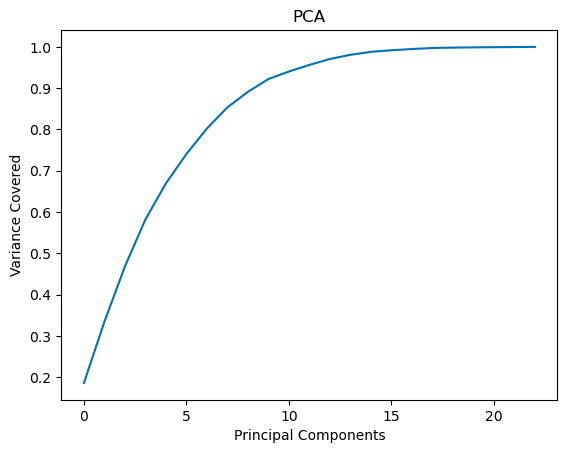

In [178]:
# lets plot scree plot to check the best components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel("Variance Covered")
plt.title('PCA')
plt.show()

### We see that in order to cover 95% - 100% of the data we need to have only have 11 features and we can remove the rest , We will use the Kbest to decide which features are the best and see if we should remove any feautes , But at this pont we will move ahead as all the columns constitute to making the model better "


In [179]:
pca.fit_transform(X_scaled1) #To scale the data with PCA so we can plot the graph to see whats the coverage 

array([[-0.11270053, -0.78722252,  0.3640668 , ...,  0.00308093,
         0.01831163,  0.02017413],
       [-0.23554103, -0.38823272,  0.78922046, ...,  0.0064747 ,
        -0.01206215, -0.01168987],
       [-0.13710131, -0.60864615,  0.9034418 , ...,  0.01038614,
         0.0346808 , -0.01070954],
       ...,
       [ 0.1786159 ,  0.46656327,  0.25506157, ...,  0.00403278,
         0.00224822, -0.02154254],
       [-0.50218051,  0.40012511,  0.11701956, ...,  0.00507733,
         0.01458244, -0.01711577],
       [ 0.16325359,  0.61332778, -0.64715226, ..., -0.00200557,
        -0.00374858,  0.0085241 ]])

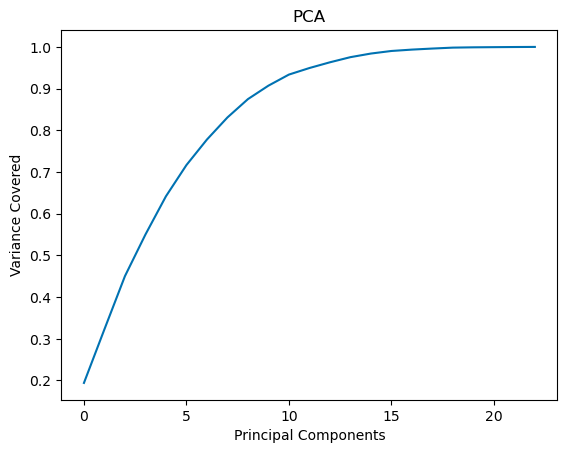

In [180]:
# lets plot scree plot to check the best components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel("Variance Covered")
plt.title('PCA')
plt.show()

### Same as the other screeplotWe see that in order to cover 95% - 100% of the data we need to have only have 11 features and we can remove the rest , We will use the Kbest to decide which features are the best and see if we should remove any feautes , But at this pont we will move ahead as all the columns constitute to making the model better "


# Using Zscore to deal with the outliers in the data-1st label-raintomorrow

In [181]:
df.shape

(7840, 24)

In [182]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([  12,   12,   41,   41,   49,   49,   57,   57,   58,   58,   59,
          59,   64,   64,   65,   65,  120,  264,  290,  375,  375,  399,
         399,  400,  400,  401,  401,  425,  539,  544,  544,  545,  656,
         656,  672,  686,  721,  721,  743,  769,  770,  775,  901,  907,
         919,  949,  950,  950,  950,  978,  979,  981, 1108, 1118, 1119,
        1119, 1121, 1159, 1172, 1173, 1207, 1211, 1234, 1235, 1327, 1381,
        1382, 1383, 1449, 1450, 1451, 1483, 1505, 1557, 1614, 1631, 1635,
        1643, 1650, 1744, 1782, 1828, 1853, 1853, 1858, 1900, 1971, 1983,
        1998, 2018, 2028, 2060, 2068, 2142, 2142, 2160, 2160, 2160, 2168,
        2169, 2203, 2367, 2423, 2440, 2461, 2461, 2473, 2525, 2608, 2609,
        2664, 2762, 2771, 2771, 2777, 2782, 2788, 2793, 2795, 2802, 2803,
        2809, 2810, 2812, 2812, 2813, 2817, 2821, 2823, 2831, 2845, 2851,
        2859, 2865, 2873, 2879, 2884, 2898, 2912, 2951, 2951, 2958, 2959,
        2959, 2960, 2966, 2967, 2967, 

In [183]:
df_new_z=df[(z<3).all(axis=1)]
df_new_z

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,Evaporation,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,1,13,13,14,0,0,0.6,13.4,22.900000,5.137809,...,71.0,22.0,1007.7,1007.1,8.000000,5.171223,16.9,21.8,12,2008
1,1,14,6,15,0,0,0.0,7.4,25.100000,6.000039,...,44.0,25.0,1010.6,1007.8,1.039480,1.632026,17.2,24.3,12,2008
2,1,15,13,15,0,0,0.0,12.9,25.700000,7.284111,...,38.0,30.0,1007.6,1008.7,2.110778,2.000000,21.0,23.2,12,2008
3,1,4,9,0,0,0,0.0,9.2,28.000000,5.393398,...,45.0,16.0,1017.6,1012.8,0.448392,1.039231,18.1,26.5,12,2008
4,1,13,1,7,0,0,1.0,17.5,32.300000,5.389607,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8180,4,10,9,6,0,0,0.0,2.8,23.400000,4.124527,...,51.0,24.0,1024.6,1020.3,0.661087,1.486286,10.1,22.4,4,2012
8181,4,0,2,0,0,1,0.0,3.6,25.300000,3.803778,...,56.0,21.0,1023.5,1019.1,0.519938,1.050539,10.9,24.5,4,2012
8182,4,5,1,3,1,0,0.0,5.4,26.900000,5.723515,...,53.0,24.0,1021.0,1016.8,0.754666,1.480901,12.5,26.1,4,2012
8183,4,1,5,5,0,0,0.0,7.8,27.000000,5.882395,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,4,2012


In [184]:
df_new_z.shape

(7452, 24)

In [185]:
#Percentage of Data loss

Data_loss = ((6631-6319)/6631)*100

In [186]:
Data_loss

4.7051726738048565

We have lost 4.70% of the data as we have to remove the skewness which occured due to outliers so that the model is not biased towards it

# Logistic Regression

In [189]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score,classification_report
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [190]:
scores=[]
for i in range(0,100):
    X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = i)
    lr.fit(X_train_ns,y_train_ns)
    pred_train = lr.predict(X_train_ns)
    pred_test=lr.predict(X_test)
    print(f"At random state {i},the training accuracy is :-{accuracy_score(y_train_ns,pred_train)}")
    print(f"At random state {i},the Testing accuracy is :-{accuracy_score(y_test,pred_test)}")
    print('\n')
    scores.append(accuracy_score(y_test,pred_test))

At random state 0,the training accuracy is :-0.758843537414966
At random state 0,the Testing accuracy is :-0.7464285714285714


At random state 1,the training accuracy is :-0.7566326530612245
At random state 1,the Testing accuracy is :-0.7540816326530613


At random state 2,the training accuracy is :-0.7523809523809524
At random state 2,the Testing accuracy is :-0.7653061224489796


At random state 3,the training accuracy is :-0.753061224489796
At random state 3,the Testing accuracy is :-0.764795918367347


At random state 4,the training accuracy is :-0.7528911564625851
At random state 4,the Testing accuracy is :-0.7571428571428571


At random state 5,the training accuracy is :-0.7568027210884354
At random state 5,the Testing accuracy is :-0.7545918367346939


At random state 6,the training accuracy is :-0.7537414965986394
At random state 6,the Testing accuracy is :-0.7658163265306123


At random state 7,the training accuracy is :-0.7605442176870748
At random state 7,the Testing accura

At random state 66,the training accuracy is :-0.7551020408163265
At random state 66,the Testing accuracy is :-0.7586734693877552


At random state 67,the training accuracy is :-0.7549319727891156
At random state 67,the Testing accuracy is :-0.7596938775510204


At random state 68,the training accuracy is :-0.7598639455782313
At random state 68,the Testing accuracy is :-0.7433673469387755


At random state 69,the training accuracy is :-0.7551020408163265
At random state 69,the Testing accuracy is :-0.7586734693877552


At random state 70,the training accuracy is :-0.7578231292517007
At random state 70,the Testing accuracy is :-0.7489795918367347


At random state 71,the training accuracy is :-0.7520408163265306
At random state 71,the Testing accuracy is :-0.7673469387755102


At random state 72,the training accuracy is :-0.7602040816326531
At random state 72,the Testing accuracy is :-0.7438775510204082


At random state 73,the training accuracy is :-0.7545918367346939
At random state 73

Finding the highest score using Argmax

In [191]:
np.argmax(scores)

9

In [192]:
scores[np.argmax(scores)]

0.7811224489795918

# We see that this model work well with the data , we see that the scores are the same at Training and testing state
    
    - we are getting 
     
     At random state 88,the training accuracy is :-0.8432158683266512

     At random state 88,the Testing accuracy is :-0.8424050632911393
     
- the training score and Testing score are equal  to each other here
- both the train and test score are really good but we will test more an also th cv score to see if its consistent  


# Train Test Split

In [193]:
X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = 5 ) 

# as the best random state we have chosen is 5

### We are creating a method called Metric to allow us to show the metrics of each classification model we use , so we dont have to code it again 

In [194]:
#Write one function and call as many times to check accuracy_score of different models

def metric_score(clf,X_train_ns,X_test,y_train_ns,y_test,train=True):
    if train:
        y_pred = clf.predict(X_train_ns)
    
        
        print("\n===============================Train Result=============================")
        
        print(f"Accuracy score : {accuracy_score(y_train_ns,y_pred) * 100: .2f}%")
        
    elif train == False:
        pred = clf.predict(X_test)
        
        print("\n===============================Test Result===============================")
        print(f"Accuracy Scorre : {accuracy_score(y_test,pred) * 100: .2f}%")
        
        
        print ('\n \n Test Classification Report \n', classification_report(y_test, pred, digits = 2)) ##Model Confidence /Accurancy
        

In [195]:
#Call the function and pass dataset to check the train score and the test score

metric_score(lr,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(lr,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  75.60%

===============================Test Result===============================
Accuracy Scorre :  75.51%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.76      1.00      0.86      1480
           1       0.00      0.00      0.00       480

    accuracy                           0.76      1960
   macro avg       0.38      0.50      0.43      1960
weighted avg       0.57      0.76      0.65      1960



### We see that this model is having a pretty good score in Logistic regression , we see the train score as 84.72% and the test score as 83.35% which is pretty good considering that this is actually a UPSIZED dataset and we have also done balancing of the label category due to imbalance 

Important to note we have used a different random state as the one we chose was having a higher train score as compared to this one so we changed

In [196]:
print(confusion_matrix(y_test,pred_test))  

[[1480    0]
 [ 480    0]]


We see that the type 1 and 2 error is pretty high , and we need to see other models , but before that we will check cv score

# Cross-Validation of the model

In [197]:
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {accuracy_score(y_train_ns,pred_train)}and the accuracy for testing is {accuracy_score(y_test,pred_test)}")
    print('\n')

At cross fold2 the cv score is 0.7561224489795918 and accuracy score for training is 0.7559523809523809and the accuracy for testing is 0.7551020408163265


At cross fold3 the cv score is 0.755739576498064 and accuracy score for training is 0.7559523809523809and the accuracy for testing is 0.7551020408163265


At cross fold4 the cv score is 0.7556122448979592 and accuracy score for training is 0.7559523809523809and the accuracy for testing is 0.7551020408163265


At cross fold5 the cv score is 0.7557397959183674 and accuracy score for training is 0.7559523809523809and the accuracy for testing is 0.7551020408163265


At cross fold6 the cv score is 0.7540816657312708 and accuracy score for training is 0.7559523809523809and the accuracy for testing is 0.7551020408163265


At cross fold7 the cv score is 0.7559948979591836 and accuracy score for training is 0.7559523809523809and the accuracy for testing is 0.7551020408163265


At cross fold8 the cv score is 0.7561224489795917 and accuracy sc

We see that the model is overfitting the data as we see the cv score of 83% approx is giving a test score of 66% approx so we need to check other models as this model is not working well and we have a underfitted test score

# Decision Tree Classifier

In [198]:
from sklearn.tree import DecisionTreeClassifier

dt=DecisionTreeClassifier()

X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = 5) #as we have seen a good score on 98th state
dt.fit(X_train_ns,y_train_ns)
pred_train = dt.predict(X_train_ns)
pred_test = dt.predict(X_test)
print(f"At random state {5},the training accuracy is :-{accuracy_score(y_train_ns,pred_train)}")
print(f"At random state {5},the Testing accuracy is :-{accuracy_score(y_test,pred_test)}")
print('\n')


At random state 5,the training accuracy is :-1.0
At random state 5,the Testing accuracy is :-0.6959183673469388




In [199]:
#Call the function and pass dataset to check the train score and the test score

metric_score(dt,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(dt,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  100.00%

===============================Test Result===============================
Accuracy Scorre :  69.59%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.80      0.79      0.80      1480
           1       0.38      0.39      0.39       480

    accuracy                           0.70      1960
   macro avg       0.59      0.59      0.59      1960
weighted avg       0.70      0.70      0.70      1960



In [200]:
print(confusion_matrix(y_test,pred_test)) 

[[1175  305]
 [ 291  189]]


# Observations from the Decision Tree Classifier :-

    - We see that the training score is boosted all the way to 100% which is the highest  but the testing score is fallen shorter than logistic regression  @ 77.28 % which is lesser than the logistic model   , also we see that the F1 score is the same as test score for accuracy and precision is 69% , 86%for 0 and only 53% for 1 which is same than the last model 
    
    - the model is not performing as good as Logistic regression but we cant use this model moving to check the cv score

In [201]:
#Cross validation of the model
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(dt,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {accuracy_score(y_train_ns,pred_train)}and the accuracy for testing is {accuracy_score(y_test,pred_test)}")
    print('\n')

At cross fold2 the cv score is 0.6303571428571428 and accuracy score for training is 1.0and the accuracy for testing is 0.6959183673469388


At cross fold3 the cv score is 0.6216840678408128 and accuracy score for training is 1.0and the accuracy for testing is 0.6959183673469388


At cross fold4 the cv score is 0.5835459183673469 and accuracy score for training is 1.0and the accuracy for testing is 0.6959183673469388


At cross fold5 the cv score is 0.632780612244898 and accuracy score for training is 1.0and the accuracy for testing is 0.6959183673469388


At cross fold6 the cv score is 0.6109552443297234 and accuracy score for training is 1.0and the accuracy for testing is 0.6959183673469388


At cross fold7 the cv score is 0.6426020408163264 and accuracy score for training is 1.0and the accuracy for testing is 0.6959183673469388


At cross fold8 the cv score is 0.6621173469387756 and accuracy score for training is 1.0and the accuracy for testing is 0.6959183673469388


At cross fold9

We see a really good improvement with the Cv score compared to the last model , we see the cv score and test score is coming really close at 72% to 77% which is really good for the model

# KNN Classifier

In [202]:
from sklearn.neighbors import KNeighborsClassifier

knn=KNeighborsClassifier()

knn.fit(X_train_ns,y_train_ns)
knn.score(X_train_ns,y_train_ns)
pred_decision =knn.predict(X_test)

knns = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',knns*100)

knnscore = cross_val_score(knn,X,y,cv=8)
knnc =knnscore.mean()
print('Cross Val Score :',knnc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 71.0204081632653
Cross Val Score : 70.48469387755102
[[1335  145]
 [ 423   57]]


In [203]:
#Call the function and pass dataset to check the train score and the test score

metric_score(knn,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(knn,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  79.56%

===============================Test Result===============================
Accuracy Scorre :  71.02%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.76      0.90      0.82      1480
           1       0.28      0.12      0.17       480

    accuracy                           0.71      1960
   macro avg       0.52      0.51      0.50      1960
weighted avg       0.64      0.71      0.66      1960



# Observations from the KNN Classifier :-
    - We see that the training score is higher than Decision tree @ 83.10%   
    
    we see that the F1 score higher  where accuracy for 0 is 90% and for 1 is 56% which is bad and model is biased towards 0 
    
    - the CV score is good though and very similar to the test accuracy @ 81% highest among the 3 models we tested , so overall the model is ok , but we need to improve the f1 score and precision
    
    - we see the confusion matrix where the typ 1 and typ 2 error is much better than the previous models but error rate very high and we need to improve , lets test other models 

# Random Forest Classifier

In [204]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()

rf.fit(X_train_ns,y_train_ns)
rf.score(X_train_ns,y_train_ns)
pred_decision =rf.predict(X_test)

rfs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=4)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 75.96938775510203
Cross Val Score : 74.20918367346938
[[1386   94]
 [ 377  103]]


In [205]:
#Call the function and pass dataset to check the train score and the test score

metric_score(rf,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(rf,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  100.00%

===============================Test Result===============================
Accuracy Scorre :  75.97%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.79      0.94      0.85      1480
           1       0.52      0.21      0.30       480

    accuracy                           0.76      1960
   macro avg       0.65      0.58      0.58      1960
weighted avg       0.72      0.76      0.72      1960



# Observations from the Random Forest Classifier :-
    - We see that like the decision tree the train score is at the max at 100% and we have test score much better at 83.23% , the F1 score is at 82% and precisiion @ 82% which is a good model and the best till now , we have imbalance dataset and we treated so we have a little higher Cv score of 81.13% approx so we are getting a good cv score as well which is on par with the test sore which is what we need the model to do 
    
    - the model has much lower errors in the confusion matrix as all the models but can be avoided

# XgBoost

In [206]:
import xgboost as xgb

xgb = xgb.XGBClassifier()

xgb.fit(X_train_ns,y_train_ns)
xgb.score(X_train_ns,y_train_ns)
pred_decision =xgb.predict(X_test)

xgbs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',xgbs*100)

xgbscore = cross_val_score(xgb,X,y,cv=9)
xgbc =xgbscore.mean()
print('Cross Val Score :',xgbc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 74.54081632653062
Cross Val Score : 70.80303610154357
[[1329  151]
 [ 348  132]]


In [207]:
#Call the function and pass dataset to check the train score and the test score

metric_score(xgb,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(xgb,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  98.78%

===============================Test Result===============================
Accuracy Scorre :  74.54%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.79      0.90      0.84      1480
           1       0.47      0.28      0.35       480

    accuracy                           0.75      1960
   macro avg       0.63      0.59      0.59      1960
weighted avg       0.71      0.75      0.72      1960



# Observations from the XGboost Classifier :-

    - We see that the training score is lower than the random forest and the decision tree at 99.98% and we see a higher accuracy score for test at 83.42 % which is  higher than the random forest ,we see the F1 score is same too @ 83% again  to rf  the precision score is 82% which is more than the Random forest 
    The CV score is exact same as the accuracy score @ 77% which is lower than the random forest whcih had a closer cv to the test score @ 81% approx so overall really good scores from this model, but the random forest shows the best as the cv score is closer to the test score , need to do more analysis

# SVC

In [208]:
from sklearn.svm import SVC

svc= SVC()

svc.fit(X_train_ns,y_train_ns)
svc.score(X_train_ns,y_train_ns)
pred_decision =svc.predict(X_test)

svcs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',svcs*100)

svcscore = cross_val_score(svc,X,y,cv=8)
svcc =svcscore.mean()
print('Cross Val Score :',svcc*100)
print(confusion_matrix(y_test,pred_decision))

Accuracy Score : 75.51020408163265
Cross Val Score : 75.59948979591837
[[1480    0]
 [ 480    0]]


In [209]:
#Call the function and pass dataset to check the train score and the test score

metric_score(svc,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(svc,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  75.63%

===============================Test Result===============================
Accuracy Scorre :  75.51%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.76      1.00      0.86      1480
           1       0.00      0.00      0.00       480

    accuracy                           0.76      1960
   macro avg       0.38      0.50      0.43      1960
weighted avg       0.57      0.76      0.65      1960



# Observations from the SVC Classifier :-
    - We see that this model is  performimg worser than all the other models we tested where the train score is 77% and the test is 76.14% F1 score is less and precioson is 38% which is less , the cv score is also on the lower side , 
    
    the confusionmatrix is giving lowest error and we dont see any predictions for 0 classes in label , so this model is not at all doing well for the dataset

## we can assume that Random Forest Classifier is the best algorithm for this project as it has the highest scores and least difference between the Cross val score and accuracy but we need to check roc auc to finalize the decision

# Let's check ROC AUC Curve for the fitted Model

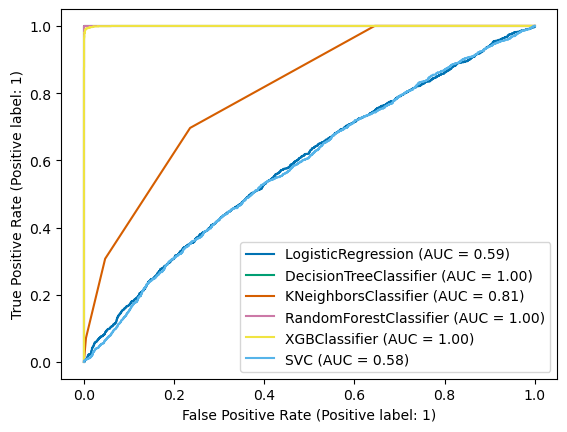

In [210]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt


### How well our model works on training Data

disp = plot_roc_curve(lr,X_train_ns,y_train_ns)

plot_roc_curve(dt,X_train_ns,y_train_ns, ax= disp.ax_) #ax_ = Axes with confusion matrix

plot_roc_curve(knn,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(rf,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(xgb,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(svc,X_train_ns,y_train_ns, ax= disp.ax_)

plt.legend(prop={'size' : 10}, loc='lower right' )

plt.show()

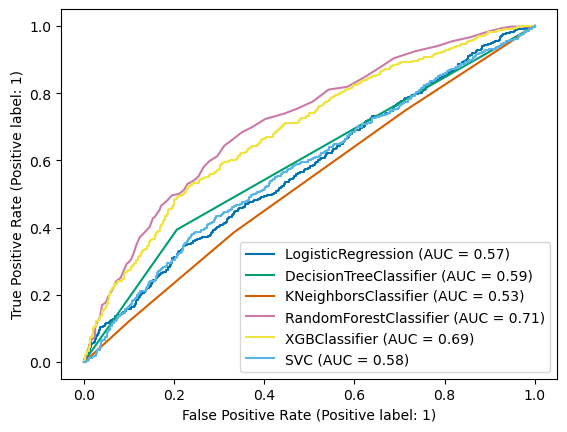

In [211]:
### How well our model works on Testing Data

disp = plot_roc_curve(lr,X_test,y_test)

plot_roc_curve(dt,X_test,y_test, ax= disp.ax_) #ax_ = Axes with confusion matrix

plot_roc_curve(knn,X_test,y_test, ax= disp.ax_)

plot_roc_curve(rf,X_test,y_test, ax= disp.ax_)

plot_roc_curve(xgb,X_test,y_test, ax= disp.ax_)

plot_roc_curve(svc,X_test,y_test, ax= disp.ax_)

plt.legend(prop={'size' : 10}, loc='lower right' )

plt.show()

# WE have again proved that we will use the Random Forest Classifier as the best  model

- The Logistic Regression is only covering 86% of training data and only 86% of the test data, same as  Random forest classifier is covering 100% of training data as well as 86% of test data which is the highest, the actual winner will be logistic regression but the cv score of random forest is better @ 81% . XGBoost may have 100% at train buts its only able to give 87% to test highest among all but the cv score is lower again so we will go with Random forest  
- closest to  XGboost classifier model is random forest Classifier but the scores a a little better with Random forest 
- Random forest  will be an even better model with Hyperparameter tuning which will increase 

# Hyper parameter Tuning

In [212]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
rf= RandomForestClassifier()

#Creating parameters to pass in RandomizedSearchCV

parameters = {'criterion':['gini','entropy'],
             'max_features':['auto','sqrt','log2'],
             'min_samples_split': [1, 2, 3, 4 ,5],
             'min_samples_leaf': [1, 3, 4, 5, 6,],
             'n_estimators' : [100,200,300,400,500]
             }

GCV = GridSearchCV(estimator = rf,param_grid=parameters, verbose=2,cv=3, n_jobs = -1, scoring='accuracy')
GCV.fit(X_train_ns,y_train_ns) #fitting data into the model
GCV.best_params_ #printing the best parameters found by the GridSearch CV

Fitting 3 folds for each of 750 candidates, totalling 2250 fits


{'criterion': 'gini',
 'max_features': 'auto',
 'min_samples_leaf': 4,
 'min_samples_split': 3,
 'n_estimators': 200}

In [213]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier(n_estimators = 200 ,min_samples_split=4,min_samples_leaf=1,max_features='sqrt',criterion='entropy')

rf.fit(X_train_ns,y_train_ns)
rf.score(X_train_ns,y_train_ns)
pred_decision =rf.predict(X_test)

rfs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=8)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)
print(confusion_matrix(y_test,pred_test)) 

Accuracy Score : 75.76530612244898
Cross Val Score : 74.52806122448979
[[1175  305]
 [ 291  189]]


We see that after tuning we are getting a higher score than we got before  , but we also see that the Cv score is come much closer to the  accuracy score @ 82% which is great as the closer the score the better the model. let save the rf model in pickle file  

In [214]:
GCV_pred=GCV.best_estimator_.predict(X_test) #predicting with the best parameters
accuracy_score(y_test,GCV_pred) #Checking Final Accuracy

0.7627551020408163

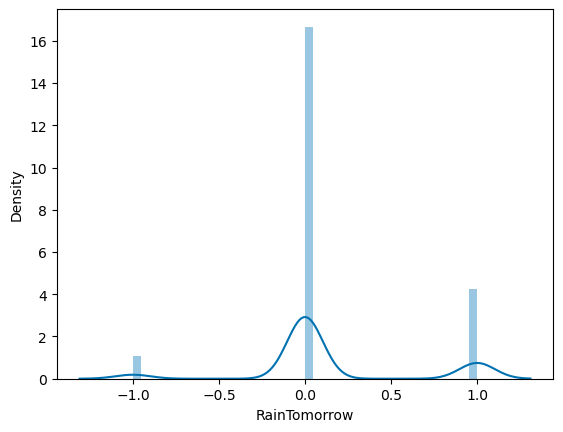

In [215]:
#Plotting distplot to show equillibrium 

sns.distplot(y_test-pred_decision)
plt.show()

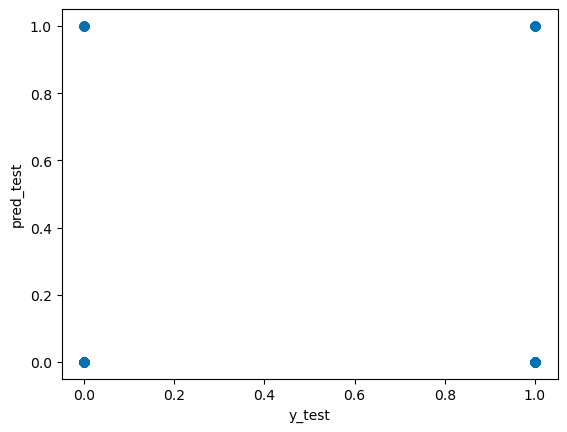

In [216]:
plt.scatter(y_test, pred_decision, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("pred_test")
plt.show()

We see that the model is accurate as the points in 0 are shown in 0 and 1 in 1 and the graph shows normal distribution as well 

In [217]:
import pickle
filename = 'raintomorrow.pkl'
pickle.dump(rf,open(filename,'wb'))

# Conclusion

In [218]:
loaded_model = pickle.load(open('raintomorrow.pkl','rb'))
result = loaded_model.score(X_test,y_test)
print(result*100)

75.76530612244898


In [219]:
conclusion = pd.DataFrame([loaded_model.predict(X_test)[:],pred_decision[:]],index=['Predicted','Orignal'])

In [220]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959
Predicted,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
Orignal,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0


# We have 1580 columns where the model has predicted and Actuals and the model we have chosen is Random Forest Classifier as the ideal model for this project

# PCA treatment

In [221]:
#Splitting the features and target for rainfall
X=df_new_z.drop(columns=['Rainfall'])
y=df_new_z['Rainfall']

In [222]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled =scaler.fit_transform(X)

In [223]:
pca = PCA()
pca.fit_transform(X_scaled)

array([[ 0.6771716 ,  1.37808853,  1.7897105 , ...,  0.40255993,
         0.04115777,  0.16533272],
       [ 2.00327806, -1.86690572,  1.7712323 , ...,  0.16453973,
         0.04259789, -0.09756368],
       [ 2.82520141, -0.52747963,  2.57443262, ...,  0.28709121,
        -0.23628322,  0.03861898],
       ...,
       [ 0.8485958 , -3.19897082,  0.06338026, ..., -0.25505846,
        -0.15515766, -0.1224534 ],
       [ 0.89320314, -2.60299042, -0.48039701, ..., -0.04940373,
        -0.18994355, -0.06254147],
       [-0.88087331,  1.00854555, -0.18540499, ..., -0.18559374,
         0.04943044,  0.03353469]])

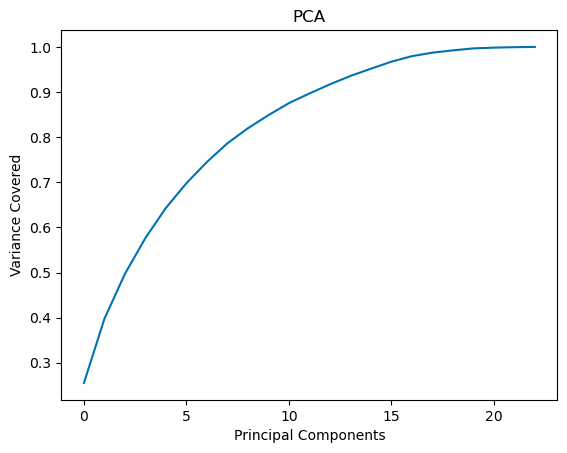

In [224]:
#lets plot scree plot to check the bset components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel("Variance Covered")
plt.title('PCA')
plt.show()

In [225]:
pca = PCA(n_components = 13)
new_pcomp = pca.fit_transform(X_scaled)
princ1_comp = pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13'])
princ1_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,0.677172,1.378089,1.789710,-2.260384,-2.628274,-1.291637,-0.156553,-0.669515,-0.145603,0.039986,0.599588,0.438140,-0.839150
1,2.003278,-1.866906,1.771232,-1.878026,-2.837675,-1.156656,-1.157266,-1.011884,-0.754261,0.090838,-0.133472,-0.201783,-0.322772
2,2.825201,-0.527480,2.574433,-2.423945,-2.434762,-1.243938,-0.170822,-0.672931,0.178066,-0.169855,0.420028,-0.176382,0.315568
3,1.786176,-3.346037,-0.129620,0.279016,-2.917124,0.164362,0.561917,-0.636407,1.265059,0.145613,1.270446,-0.369535,-0.446773
4,1.303150,1.473673,-0.893336,-1.011324,-3.152664,-0.733052,0.358327,-0.888297,-1.446446,0.258944,-0.193990,0.228889,-2.130580
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7447,-0.315619,-3.660092,1.251951,0.240923,0.098846,-0.674644,-0.299864,0.732583,0.391932,-0.004778,0.749066,0.106393,-0.630520
7448,-0.023219,-3.974427,-0.274195,2.070423,-0.460625,1.850477,-0.722490,0.527781,-0.313574,-1.007910,1.066654,0.240375,-0.320198
7449,0.848596,-3.198971,0.063380,0.960033,-0.337216,1.222425,-0.844121,0.636123,-0.012981,1.908980,-0.101060,0.220353,-0.937043
7450,0.893203,-2.602990,-0.480397,1.297669,-0.607938,-0.237430,-0.320077,0.822820,-0.030970,0.543701,1.080542,0.404781,-0.076864


In [226]:
#Data split into train and test

X_train,X_test,y_train,y_test = train_test_split(princ1_comp ,y,test_size = 0.25,random_state = 355)

## See that we are getting the same score even after incorporating the PCA so we are going to use all the features , seen that with PCS r2 score is 49.94% and without its 50.06%

In [227]:
df_new_z.skew()

Location        -0.285981
WindGustDir      0.105672
WindDir9am       0.185176
WindDir3pm      -0.134700
RainToday        1.145867
RainTomorrow     1.186669
Rainfall         3.500878
MinTemp         -0.061318
MaxTemp          0.318112
Evaporation      0.669502
Sunshine        -0.276216
WindGustSpeed    0.555556
WindSpeed9am     0.699000
WindSpeed3pm     0.307295
Humidity9am     -0.236493
Humidity3pm      0.130350
Pressure9am     -0.043520
Pressure3pm      0.013869
Cloud9am        -0.137232
Cloud3pm        -0.063885
Temp9am         -0.031999
Temp3pm          0.336700
Date_month       0.065155
Date_year        0.421669
dtype: float64

See that the data is reduced skewness after the zscore treatment as well and the only ones having are categorical columns as well as the target itself which we cant treat so there is some issue with the data 

In [228]:
X

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,1,13,13,14,0,0,13.4,22.900000,5.137809,6.580611,...,71.0,22.0,1007.7,1007.1,8.000000,5.171223,16.9,21.8,12,2008
1,1,14,6,15,0,0,7.4,25.100000,6.000039,12.412480,...,44.0,25.0,1010.6,1007.8,1.039480,1.632026,17.2,24.3,12,2008
2,1,15,13,15,0,0,12.9,25.700000,7.284111,11.772105,...,38.0,30.0,1007.6,1008.7,2.110778,2.000000,21.0,23.2,12,2008
3,1,4,9,0,0,0,9.2,28.000000,5.393398,12.880993,...,45.0,16.0,1017.6,1012.8,0.448392,1.039231,18.1,26.5,12,2008
4,1,13,1,7,0,0,17.5,32.300000,5.389607,6.370655,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8180,4,10,9,6,0,0,2.8,23.400000,4.124527,11.922682,...,51.0,24.0,1024.6,1020.3,0.661087,1.486286,10.1,22.4,4,2012
8181,4,0,2,0,0,1,3.6,25.300000,3.803778,12.562014,...,56.0,21.0,1023.5,1019.1,0.519938,1.050539,10.9,24.5,4,2012
8182,4,5,1,3,1,0,5.4,26.900000,5.723515,12.345127,...,53.0,24.0,1021.0,1016.8,0.754666,1.480901,12.5,26.1,4,2012
8183,4,1,5,5,0,0,7.8,27.000000,5.882395,11.123465,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,4,2012


In [229]:
y

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8180    0.0
8181    0.0
8182    0.0
8183    0.0
8184    0.0
Name: Rainfall, Length: 7452, dtype: float64

## Progressing to the normal steps as additional steps did not help increasing the score 

In [230]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size = 0.75,random_state = 322)

In [231]:
from sklearn.preprocessing import StandardScaler # scale the data as we have very high values in fnlwgt

scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns)
X_test= pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
X_train

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,-1.564493,1.216579,1.689126,1.163909,1.764251,-0.556890,-1.137912,-0.115222,-0.546458,0.540976,...,0.913100,-0.672063,1.498122,1.059731,-0.590995,-0.697590,-0.874490,0.071800,-0.686872,-0.814706
1,0.149067,-0.910047,0.383383,0.260770,1.764251,-0.556890,0.586838,0.965345,0.393450,0.048315,...,-0.248082,-0.947900,0.026769,-0.160607,0.104948,0.675928,0.607270,1.183237,-0.686872,0.803990
2,-0.193645,1.216579,1.471502,1.615479,-0.566813,1.795686,1.336132,1.081714,1.015485,-0.021798,...,-0.532771,0.210615,0.380885,0.365273,0.629954,0.276700,1.656192,0.960950,0.182188,-0.410032
3,0.491778,0.791254,0.818630,0.486554,-0.566813,1.795686,0.745315,1.015218,0.219844,0.286436,...,1.093834,-0.175556,0.059198,-0.094901,0.235168,-0.151370,0.159169,1.012247,-1.266246,1.208664
4,-1.564493,-0.910047,-0.922361,0.712339,-0.566813,-0.556890,0.560685,-0.697065,-0.875190,-1.740718,...,1.636036,2.472480,-1.236607,-1.226899,1.385709,1.474385,-0.001227,-0.629260,1.051249,-0.814706
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5584,-1.564493,1.429242,-0.051865,1.615479,-0.566813,1.795686,-0.085520,0.084268,-0.159795,-1.026765,...,0.611877,1.038127,-2.087041,-2.073799,1.385709,1.474385,-0.910133,-0.697656,1.630622,-1.624053
5585,-1.564493,1.641905,-1.139985,0.486554,-0.566813,-0.556890,0.763778,2.045912,1.399989,2.046554,...,-1.496685,-1.830579,0.547637,0.365273,-1.434714,-1.517300,1.228471,2.157882,1.340935,-1.219380
5586,1.177202,1.429242,1.471502,1.389694,-0.566813,-0.556890,0.542222,0.084268,0.192576,-0.654810,...,0.491388,1.038127,-0.136046,0.297521,0.624113,1.075156,0.925502,0.037602,0.471875,1.613337
5587,-1.564493,-0.059396,0.165759,1.389694,-0.566813,-0.556890,0.246814,1.713430,2.134772,1.779582,...,-1.195461,-2.271918,-0.853078,-1.091395,-1.155777,-1.180648,0.551246,1.901396,-1.266246,-1.219380


# Linear Regression Model

In [232]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

In [233]:
scores_test=[]
for i in range(0,100):
    X_train,X_test,y_train,y_test = train_test_split(princ1_comp,y,test_size = 0.25,random_state = i)
    lr.fit(X_train,y_train)
    pred_train = lr.predict(X_train)
    pred_test = lr.predict(X_test)
    print(f"At random state {i},the training accuracy is :-{r2_score(y_train,pred_train)}")
    print(f"At random state {i},the testing accuracy is :-{r2_score(y_test,pred_test)}")
    print('\n')
    scores_test.append(r2_score(y_test,pred_test))

At random state 0,the training accuracy is :-0.13488345539541624
At random state 0,the testing accuracy is :-0.1186897319058049


At random state 1,the training accuracy is :-0.13757970449463286
At random state 1,the testing accuracy is :-0.1111059031734496


At random state 2,the training accuracy is :-0.12540275958464597
At random state 2,the testing accuracy is :-0.14919420249162807


At random state 3,the training accuracy is :-0.1281562123803538
At random state 3,the testing accuracy is :-0.13887030500742004


At random state 4,the training accuracy is :-0.1293243595823399
At random state 4,the testing accuracy is :-0.13747596532248663


At random state 5,the training accuracy is :-0.13396106855119438
At random state 5,the testing accuracy is :-0.11974003888531404


At random state 6,the training accuracy is :-0.14041328757654958
At random state 6,the testing accuracy is :-0.10065015968525726


At random state 7,the training accuracy is :-0.12972683497616133
At random state 7,the 

At random state 65,the training accuracy is :-0.13434429492035516
At random state 65,the testing accuracy is :-0.12049523031309528


At random state 66,the training accuracy is :-0.12344952627384542
At random state 66,the testing accuracy is :-0.1443956005167174


At random state 67,the training accuracy is :-0.12996256741786327
At random state 67,the testing accuracy is :-0.13371240351055136


At random state 68,the training accuracy is :-0.13241842054415143
At random state 68,the testing accuracy is :-0.1278435548458534


At random state 69,the training accuracy is :-0.13629826865164396
At random state 69,the testing accuracy is :-0.1171692563980351


At random state 70,the training accuracy is :-0.1283356498763063
At random state 70,the testing accuracy is :-0.13762439475691446


At random state 71,the training accuracy is :-0.1382220162984753
At random state 71,the testing accuracy is :-0.11139637131497981


At random state 72,the training accuracy is :-0.1387709219242378
At random

In [234]:
scores_test[np.argmax(scores_test)]

0.15256315185534863

# We have seen that the best random state for the observations is 30 but all are at 50% and which is very low for the model and is not good fit for the data 

At random state 30,the training accuracy is :-0.5014971732811984



At random state 30,the testing accuracy is :-0.5006375344803744


We have chosen this as the difference between the two scores is very very less almost in decimals and the rest are not higher than this 

### Splitting again train test split with ideal Random state

In [235]:
X_train,X_test,y_train,y_test = train_test_split(princ1_comp,y,test_size = 0.25,random_state = 30)

In [236]:
lr.fit(X_train,y_train)

LinearRegression()

In [237]:
pred_test=lr.predict(X_test)

In [238]:
print(r2_score(y_test,pred_test))

0.10662023905135165


# We observed that Linear Regression is doing very poorly with this data as we are getting 50.06% approx which is very less  50% itself means its not a good model


We will try other models cause we cant consider a model with  50% r2 score

# Cross-Validation of the model

In [239]:
Train_accuracy=r2_score(y_train,pred_train)
Test_accuracy=r2_score(y_test,pred_test)

from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {Train_accuracy}and the accuracy for testing is {Test_accuracy}")
    print('\n')

At cross fold2 the cv score is 0.10419576853338103 and accuracy score for training is -0.14071563474394178and the accuracy for testing is 0.10662023905135165


At cross fold3 the cv score is 0.14386242937567142 and accuracy score for training is -0.14071563474394178and the accuracy for testing is 0.10662023905135165


At cross fold4 the cv score is 0.15021579761585338 and accuracy score for training is -0.14071563474394178and the accuracy for testing is 0.10662023905135165


At cross fold5 the cv score is 0.15665945515438154 and accuracy score for training is -0.14071563474394178and the accuracy for testing is 0.10662023905135165


At cross fold6 the cv score is 0.15661970375924444 and accuracy score for training is -0.14071563474394178and the accuracy for testing is 0.10662023905135165


At cross fold7 the cv score is 0.15616975093529623 and accuracy score for training is -0.14071563474394178and the accuracy for testing is 0.10662023905135165


At cross fold8 the cv score is 0.1663255

## we see that the cv scores are pretty close to the test score and we see that cv score @ 7 is the closes to the test score @ 49% , but overall we see that the model is not doing well for the dataset

# Plotting the linear Regression graph with actual and predicted values comparison

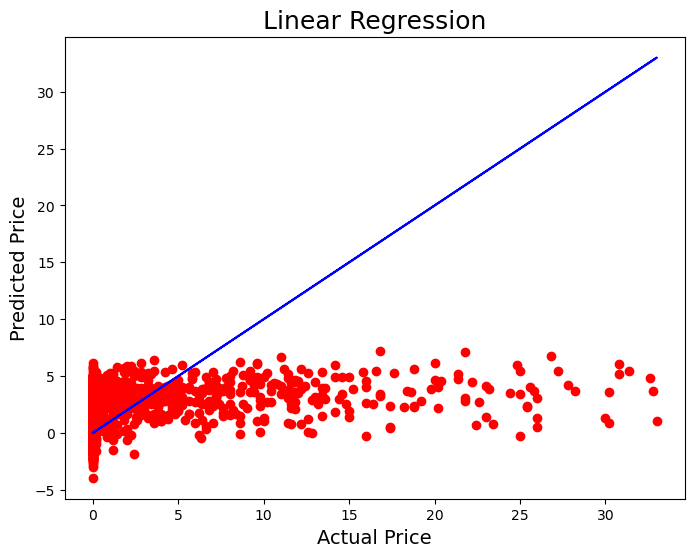

In [240]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual Price',fontsize=14)
plt.ylabel('Predicted Price',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.show()

## We see that the model is doing exceptionally bad in predicting , here we see the actual and predicted are not on the same line which is really really bad and the data is not showing a trend as well

# Regularization of the Linear Model

In [241]:
from sklearn.model_selection import GridSearchCV #to select the pest parameters for hyperparameter tuning
from sklearn.model_selection import cross_val_score #to check the difference from the earlier score without hyper parameter tuning

In [242]:
from sklearn.linear_model import Lasso

parameters ={'alpha' : [.0001, .001, .01, .1, 1, 10],
            'random_state' : list(range(0,15))}
ls = Lasso()
clf = GridSearchCV(ls,parameters)
clf.fit(X_train, y_train)

print(clf.best_params_)

{'alpha': 0.01, 'random_state': 0}


# Final model training for Linear Regression

In [243]:
ls = Lasso(alpha= 0.01, random_state= 0)
ls.fit(X_train,y_train)
ls_score_training = ls.score(X_train,y_train)
pred_ls = ls.predict(X_test)
ls_score_training*100

13.889505151505265

We are getting a bad lasso score of 50.14% which is very high to the cross val score 49% approx for training we got earlier so we cant consider the model is doing very bad for this dataset


A reason for the  scores to be this bad is due to the nature of the label, as we see that the dataset is imbalanced initially where rain only fell 26% approx of the time , so the values in the label have huge outliers as there is an extreme range btw the days it doesnt rain and the dates it does as well as the other properties have such extreme values , even after treatment with zscore we see that the model is not able to get a normally distributed dataset to make a better prediction so we will have to try other models and see if this improves

# Checking MSE,RMSE score 

In [244]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.668565201320296
MSE: 21.26398701063252
RMSE: 4.611289083394417


We see that the values of the mae and mse are really good , very less error rates are seen 

# Decision Tree Regressor

In [245]:
from sklearn.tree import DecisionTreeRegressor

dt=DecisionTreeRegressor()
dt.fit(X_train,y_train)
dt.score(X_train,y_train)
pred_test =dt.predict(X_test)
dfs = r2_score(y_test,pred_test)
print('R2 Score :',dfs*100)

dfscore = cross_val_score(dt,X,y,cv=7)
dfc =dfscore.mean()
print('Cross Val Score :',dfc*100)


R2 Score : -55.28370932248843
Cross Val Score : -73.42816025935747


## We observe that for Decision tree regressor :-
- The model is  at R2 Score of 10.87 %approx which is way worse that linear regression
- we also see that the cross val score is also very bad compared to linear , and we cannot choose this model as well as the score is 5.01 % approx 
- there is very slight  difference between the r2 score and cross val score but the model has a horrible score of 10% which is not good
- we see that the score is much much better  than Linear regression model of 50% approx
- tryin the next model which is knn as we need to have a closer difference btw the cross val and R2 Score 


In [246]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.7563070316693503
MSE: 36.96021470746108
RMSE: 6.079491319794863


We see that the mse is a little on higher end but the rest of the scores are good here , but the r2 score is not moving on

# K- Nearest Neighbors

In [247]:
from sklearn.neighbors import KNeighborsRegressor

knn=KNeighborsRegressor()
knn.fit(X_train,y_train)
knn.score(X_train,y_train)
pred_test =knn.predict(X_test)
knns = r2_score(y_test,pred_test)
print('R2 Score :',knns*100)

knnscore = cross_val_score(knn,X,y,cv=8)
knnc =knnscore.mean()
print('Cross Val Score :',knnc*100)


R2 Score : 7.996913128487371
Cross Val Score : 15.184371304388328


# We observe that for K-nearest neighbors :-
- The model is not at all working well for the data set and we see that the score is a horrible  compared to linear regression model but higher than Decision tree @ 12.31% approx
- we also see that the cross val score is also very bad compared to linear  , and we cannot choose this modelsame as  the linear model but its better that Decision tree cv score @ 10 % approx 
- there is very less  difference between the r2 score and cross val score  
- tryin the next model which is Enseble techniques , and we will use Random Forest Regressor 


In [248]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.279141170155663
MSE: 21.898329575952765
RMSE: 4.679565105429432


We see that the mse is a little on higher end but the rest of the scores are good here , but the r2 score is not moving on

# Random Forest Regressor

In [249]:
from sklearn.ensemble import RandomForestRegressor

rf=RandomForestRegressor()
rf.fit(X_train,y_train)
rf.score(X_train,y_train)
pred_decision =rf.predict(X_test)

rfs = r2_score(y_test,pred_decision)
print('R2 Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=7)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)


R2 Score : 16.3399820923134
Cross Val Score : 24.79914223013964


# We observe that for Random Forest Regressor :-

- The model is doing much better than the 3 models we test before , the R2 score is @ 53% approx which is much better than the rest and our cross val is still better @ 50.99% approx
- we also see that the cross val score is a little better compared to linear and tree,  we see the Difference between the R2 score and cv score is good as well
- we see that the score is higher than Linear regression model of 50% approx
- tryin the next model which is Ensemble techniques , and we will use Ada boosted Trees 



In [250]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.279141170155663
MSE: 21.898329575952765
RMSE: 4.679565105429432


# ADA Boost Regressor

In [251]:
from sklearn.ensemble import AdaBoostRegressor
ada = AdaBoostRegressor()

ada.fit(X_train,y_train)
ada.score(X_train,y_train)
pred_decision =ada.predict(X_test)

adas = r2_score(y_test,pred_decision)
print('R2 Score :',adas*100)

adascore = cross_val_score(ada,X,y,cv=7)
adac =adascore.mean()
print('Cross Val Score :',adac*100)


R2 Score : -38.09906547842399
Cross Val Score : -17.16265820588895


In [252]:
#Checking MAE MSE and RMSE scores
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_decision))
print('MSE:', metrics.mean_squared_error(y_test, pred_decision))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_decision)))

MAE: 4.37042597090317
MSE: 32.86997157172548
RMSE: 5.73323395403724


# We observe that for ADA Boost Regressor :-
- The model is not  working well for the data set and we see that the score is also very low compared to Random forest & Linear as well by a small margin
- we also see that the cross val score is a much much lower  compared to linear and random forest ,   we cannot choose this over the random forest  
- there is very lettlw  difference between the r2 score  and cross val score but the model is not doing well at all 
- we see that the score is lesser than Linear regression model of 43% approx
- tryin the next model which is Xgboost model 


# Xgboost Regressor

In [253]:
import xgboost as xgb
xgb = xgb.XGBRegressor()

xgb.fit(X_train,y_train)
xgb.score(X_train,y_train)
pred_decision =xgb.predict(X_test)

xgbs = r2_score(y_test,pred_decision)
print('R2 Score :',xgbs*100)

xgbscore = cross_val_score(xgb,X,y,cv=7)
xgbc =xgbscore.mean()
print('Cross Val Score :',xgbc*100)



R2 Score : 4.581148813040315
Cross Val Score : 16.778613287912755


In [254]:
#Checking MAE MSE and RMSE scores
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_decision))
print('MSE:', metrics.mean_squared_error(y_test, pred_decision))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_decision)))

MAE: 2.629051715353733
MSE: 22.711340696306802
RMSE: 4.76564168778002


# We observe that for Xtreme Gradient Boost Regressor :-

- The model is giving lesser score than linear regression and random forest @ 47.30%
- we also see that the cross val score is a much much closer  compared to linear and all the models ,  
- we see that the mae and mse score are low , which is good
   

In [255]:
#Checking MAE MSE and RMSE scores
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.279141170155663
MSE: 21.898329575952765
RMSE: 4.679565105429432


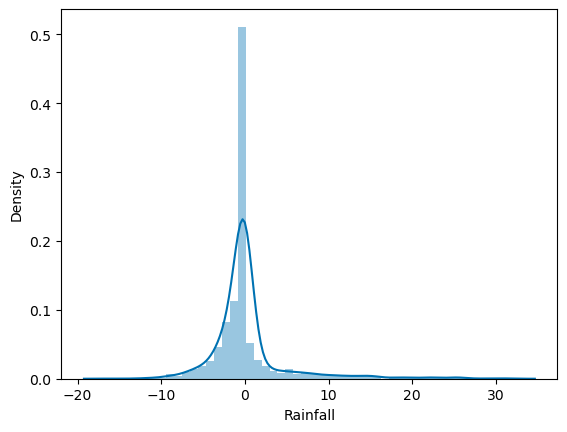

In [256]:
#Plotting distplot to show equillibrium 

sns.distplot(y_test-pred_test)
plt.show()

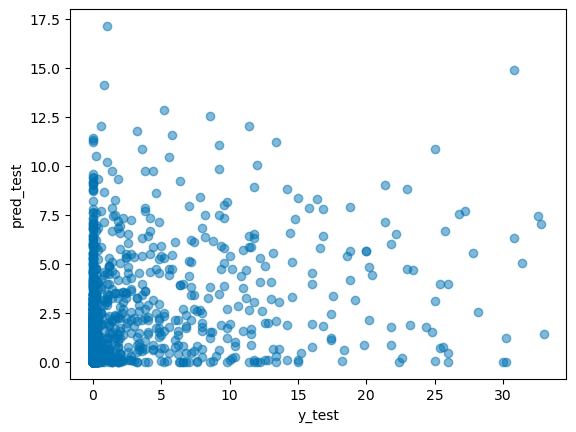

In [257]:
plt.scatter(y_test, pred_test, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("pred_test")
plt.show()

In [258]:
import pickle
filename = 'rainfall.pkl'
pickle.dump(rf,open(filename,'wb'))

# Conclusion

In [259]:
loaded_model = pickle.load(open('rainfall.pkl','rb'))
result = loaded_model.score(X_test,y_test)
print(result*100)

16.3399820923134


In [262]:
conclusion = pd.DataFrame([loaded_model.predict(X_test)[:],pred_decision[:]],index=['Predicted','Orignal'])

In [261]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1853,1854,1855,1856,1857,1858,1859,1860,1861,1862
Predicted,2.01400,1.320000,9.4340,0.144000,3.060000,0.266000,0.191000,1.058000,5.066000,6.538000,...,0.35200,7.204000,0.532000,1.371000,3.872000,5.022000,2.992000,0.081000,6.802000,5.010000
Orignal,0.99546,2.358367,6.2631,0.993914,2.560465,3.026481,1.273228,0.200629,6.032272,4.433428,...,1.47399,5.040658,0.600576,1.460675,0.507861,6.218179,4.612425,0.209558,4.966552,2.921993


### We see that the model has predicted the charges on 1580 columns againest the actual charges , so the Random Forest is the best one of them all